# Geo-semantic research work on crime clustering and social risk hostpot

<h2>Methodology</h2>

<b>
Contents:


1.   Data Acquisition
2.   Cases filtering
3.   Data Prepocessing and Information Retrieval
4.   Location Geoparsing
5.   Visualizations
6.   Exploratory Analysis

</b>


# 3.0 Methodology

## All Installations

In [ ]:
!pip install geopy

In [ ]:
!pip install spacy-transformers
!pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 197.5/197.5 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 18.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 32.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 26.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 42.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 63.3 MB/s eta 0:00:00


In [ ]:
# !pip install -U spacy
import spacy
print(spacy.__version__)

# Download the model
# spacy.cli.download("en_core_web_trf") # does not show download progress info

# Download en_core_web_trf
!python -m spacy download en_core_web_trf # show download progress info

3.5.4
2023-08-05 14:44:23.022123: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 460.3/460.3 MB 3.3 MB/s eta 0:00:00
  Using cached transformers-4.30.2-py3-none-any.whl (7.2 MB)
  Attempting uninstall: transformers
    Found existing installation: transformers 4.31.0
    Uninstalling transformers-4.31.0:
      Successfully uninstalled transformers-4.31.0
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_trf')


In [ ]:
!pip install geopandas

## 3.1 Data Acquisition
The data for this study was gathered by scraping the popular Nigeria Punch newspaper using 'kidnap' as the search query.

The python function `find_articles` used to scrape the news articles and headlines was adapted from [Scraping News Articles on Kidnapping using Python & BeautifulSoup](https://medium.com/@joyelere/scraping-news-articles-on-kidnapping-using-python-beautifulsoup-e5970adec709) by [Joyelere](https://medium.com/@joyelere) and modified to suit the needs of this project

In [ ]:
# Mount the Google Drive to load files from Google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from bs4 import BeautifulSoup
import requests
import pandas as pd

#### Scraping code

In [ ]:
# A function to find newspaper articles with 'kidnap' search query
def find_articles(start, end):
    data = []
    keyword = 'kidnap'

    # home Url of newspaper to scrape from
    base_url = 'https://punchng.com/page/'

    # Keyword integration
    key= '/?s='+ keyword

    for pageNo in range(start, end):
        # combining url with page number
        url = base_url+ str(pageNo)+key
        html_text= requests.get(url).text
        soap = BeautifulSoup(html_text,'html.parser')
        articles =soap.find_all('article')
        # print(articles)

        for article in articles:
            title = article.find_all('h1',class_='post-title')
            if title is not None:
                for i in title:
                    title = i.text.strip()
                    links= i.a['href']
                    article_response = requests.get(links)
                    article_soup = BeautifulSoup(article_response.text, 'html.parser')
                    news_=article_soup.find_all('div',class_='post-content')
                    pub_date =article_soup.find('span',class_='post-date').text.strip()
                    for news_article in news_:
                        news = news_article.find('p')
                        if news is not None:
                        # print(newss.text.strip())
                            data.append({'pub_date':pub_date,'headline': title, 'article': news.text.strip()})

    return data


In [ ]:
# this was restricted to the first page alone because of time the main methodology scraped to the 500th page
df = pd.DataFrame(find_articles(1, 3))
print(df.shape)
df.head()

(20, 3)


,pub_date,headline,article
0,9th May 2023,Security operatives kill four suspected kidnap...,Security operatives in Anambra State have kill...
1,9th May 2023,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda..."
2,8th May 2023,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...
3,8th May 2023,Bandits kidnap 40 Kaduna worshippers during ch...,Some bandits were reported to have at kidnappe...
4,8th May 2023,"Delta Gov-elect will halt kidnapping, other vi...",A chieftain of the Peoples Democratic Party in...


In [ ]:
df.tail(20)

,pub_date,headline,article
0,9th May 2023,Security operatives kill four suspected kidnap...,Security operatives in Anambra State have kill...
1,9th May 2023,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda..."
2,8th May 2023,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...
3,8th May 2023,Bandits kidnap 40 Kaduna worshippers during ch...,Some bandits were reported to have at kidnappe...
4,8th May 2023,"Delta Gov-elect will halt kidnapping, other vi...",A chieftain of the Peoples Democratic Party in...
5,8th May 2023,Kidnapped Imo bizman found dead in Anambra aft...,"An Imo State businessman, Mr Ikechukwu Ebelebe..."
6,8th May 2023,Abuja policemen free 58 victims in kidnappers’...,A kidnap victim identified as Tama Jonathan ha...
7,7th May 2023,"Gunmen kill policeman, kidnap caretaker chairm...",The yet-to-be-identified gunmen on Sunday atta...
8,7th May 2023,I buried my kidnap victim alive – Katsina suspect,"A 30-year-old man, Abubakar Abdulaziz, who is ..."
9,6th May 2023,"Bandits kill kidnap victim, FCT police rescue 22",The anti-kidnapping team of the Federal Capita...


In [ ]:
# Check and remove duplicates
df = df.drop_duplicates()
print(df.shape)

(20, 3)


## 3.2 Kidnap cases Filtering
For filtering and classification of the articles to kidnap cases and rescue cases reports we have two approach, which includes:


1.   Basic Rule based approach: This involves searching the headline for terminologies that are synonimous to a rescue operation or freedom, although this is a simple and explainable method but limitations of this approach includes:
2.   Dependency parsing based NER: This involves using inductive reasoning on the reports headlines to classify while understanding the dependency of each words in a sentence tokenized text.



In [ ]:
# Using Basic Rule based classification approach

# List of likely rescue keywords
rescue_keywords = ['rescue', 'saved', 'free', 'nab', 'release',
                   'liberate', 'found', 'recover', 'arrest', 'ransomed',
                   'neutrali', 'foil', 'end', 'court', 'sentence',
                   'escape']

# Function to check if a string contains any of the rescue keywords
def contains_rescue_keyword(text):
    for keyword in rescue_keywords:
        if keyword in text.lower():
            return True
    return False


In [ ]:
# Apply the function to the article text column and create a new rescue column
df_br = df.copy()
print(df_br.shape)
df_br['rescue'] = df_br['headline'].apply(contains_rescue_keyword)

# Print the resulting dataframe
print(sum(df_br['rescue']))
df_br.head(10)

(20, 3)
9


,pub_date,headline,article,rescue
0,9th May 2023,Security operatives kill four suspected kidnap...,Security operatives in Anambra State have kill...,False
1,9th May 2023,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda...",False
2,8th May 2023,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...,False
3,8th May 2023,Bandits kidnap 40 Kaduna worshippers during ch...,Some bandits were reported to have at kidnappe...,True
4,8th May 2023,"Delta Gov-elect will halt kidnapping, other vi...",A chieftain of the Peoples Democratic Party in...,False
5,8th May 2023,Kidnapped Imo bizman found dead in Anambra aft...,"An Imo State businessman, Mr Ikechukwu Ebelebe...",True
6,8th May 2023,Abuja policemen free 58 victims in kidnappers’...,A kidnap victim identified as Tama Jonathan ha...,True
7,7th May 2023,"Gunmen kill policeman, kidnap caretaker chairm...",The yet-to-be-identified gunmen on Sunday atta...,False
8,7th May 2023,I buried my kidnap victim alive – Katsina suspect,"A 30-year-old man, Abubakar Abdulaziz, who is ...",False
9,6th May 2023,"Bandits kill kidnap victim, FCT police rescue 22",The anti-kidnapping team of the Federal Capita...,True


In [ ]:
df_br.shape

(20, 4)

In [ ]:
kidnap_br = (df_br[df_br['rescue'] == False]).drop(columns='rescue')
print(kidnap_br.shape)
kidnap_br

(11, 3)


,pub_date,headline,article
0,9th May 2023,Security operatives kill four suspected kidnap...,Security operatives in Anambra State have kill...
1,9th May 2023,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda..."
2,8th May 2023,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...
4,8th May 2023,"Delta Gov-elect will halt kidnapping, other vi...",A chieftain of the Peoples Democratic Party in...
7,7th May 2023,"Gunmen kill policeman, kidnap caretaker chairm...",The yet-to-be-identified gunmen on Sunday atta...
8,7th May 2023,I buried my kidnap victim alive – Katsina suspect,"A 30-year-old man, Abubakar Abdulaziz, who is ..."
12,3rd May 2023,Police kill suspected kidnapper in Delta hotel...,Operatives of the Delta State Police Command h...
14,2nd May 2023,Lagos couple kidnaps selves or kidnap selves?,A Lagos-based couple caused a stir days ago. T...
16,1st May 2023,Police trailing kidnappers of Catholic priests...,The Delta State Police Command says the comman...
18,1st May 2023,Gunmen kidnap two Catholic priests in Delta,Tension has gripped the Catholic community in ...


In [ ]:
!pip install --upgrade transformers


  Using cached transformers-4.31.0-py3-none-any.whl (7.4 MB)
  Attempting uninstall: transformers
    Found existing installation: transformers 4.30.2
    Uninstalling transformers-4.30.2:
      Successfully uninstalled transformers-4.30.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
spacy-transformers 1.2.5 requires transformers<4.31.0,>=3.4.0, but you have transformers 4.31.0 which is incompatible.


In [ ]:
import spacy
import spacy_transformers, transformers
from spacy import displacy


In [ ]:
# Load the English language model
nlp_sm = spacy.load('en_core_web_sm')
nlp_trf = spacy.load('en_core_web_trf')

RuntimeError: ignored

In [ ]:
print(nlp_trf.meta['lang'])
print(nlp_trf.meta['name'])
print(nlp_trf.path)


en
core_web_trf
/usr/local/lib/python3.10/dist-packages/en_core_web_trf/en_core_web_trf-3.5.0


In [ ]:
# Using dependency parsing based classification approach
kidnap_words = ['kidnap', 'abduct', 'whisk']

def is_kidnap_or_abduct(text):
    for token in nlp_trf(text):
        if token.dep_ == 'ROOT':
            return any([toke.lemma_.lower() in kidnap_words and toke.pos_ == 'VERB' and toke.dep_ in ['ROOT', 'dep', 'conj'] for toke in token.subtree])


In [ ]:
# Make a copy of the general dataframe
df_db = df.copy()

# applying the filter_cases to the dataframe
df_db['kidnap'] = df_db['headline'].apply(is_kidnap_or_abduct)
df_db.sample(10)


,pub_date,headline,article,kidnap
20,29th April 2023,"Security operatives arrest three kidnappers, r...",Three members of a suspected criminal gang of ...,False
63,7th April 2023,Rivers APC confirms kidnapped lawyer’s release,The All Progressives Congress in Rivers State ...,False
60,9th April 2023,Gunmen kidnap 333 Nigerians in six weeks,No fewer than 333 people have been kidnapped i...,True
45,15th April 2023,Police arrest suspects over attempted Tiwa Sav...,The Nigeria Police Force Criminal Investigatio...,False
11,3rd May 2023,Police kill suspected kidnapper in Delta hotel...,Operatives of the Delta State Police Command h...,False
44,16th April 2023,Oyo police arrest kidnap kingpin after foiled ...,Oyo State Police Command has arrested a kidnap...,False
94,14th March 2023,Kidnapped Ogun journalist rescued in Lagos aft...,The Ogun State Police Command has confirmed th...,False
83,24th March 2023,"Niger kidnappers nabbed in Abuja, seven childr...",The Niger State Police Command has confirmed t...,False
18,30th April 2023,Couple fake kidnap to extort UK relatives,The Lagos State Police Command says it has arr...,False
81,24th March 2023,Delta CJ sets two kidnap suspects free from pr...,"Delta State Chief Judge, Hon. Justice Tessy Di...",False


In [ ]:
kidnap_db = (df_db[df_db['kidnap'] == True]).drop(columns='kidnap')
print(kidnap_db.shape)
kidnap_db

(22, 3)


,pub_date,headline,article
0,9th May 2023,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda..."
1,8th May 2023,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...
6,7th May 2023,"Gunmen kill policeman, kidnap caretaker chairm...",The yet-to-be-identified gunmen on Sunday atta...
13,2nd May 2023,Lagos couple kidnaps selves or kidnap selves?,A Lagos-based couple caused a stir days ago. T...
17,1st May 2023,Gunmen kidnap two Catholic priests in Delta,Tension has gripped the Catholic community in ...
19,29th April 2023,"Lagos couple kidnaps selves, demands N5m ranso...",The Lagos State Police Command has arrested a ...
23,27th April 2023,Bandits kidnap Zamfara district head,The District Head of Kasuwar Daji in the Kaura...
37,20th April 2023,Gunmen kidnap Nasarawa deputy gov's driver,"Gunmen have kidnapped Daniel Ogoshi, the drive..."
38,19th April 2023,"Kaduna: Bandits kill 214, kidnap 746 in three ...",The Kaduna State Commissioner for Internal Sec...
42,17th April 2023,"Kidnappers kill two civilians, injure three po...",Three operatives of the Rivers State Police Co...


## Add recent News to saved archive

In [ ]:
file_path = '/content/drive/MyDrive/punch_kidnap_dataset/saved csv/kidnap_full.csv'
df1 = pd.read_csv(file_path)
df1.head()

,pub_date,headline,article
0,12th March 2023,Gunmen kidnap nine in Abuja estate,Gunmen have kidnapped no fewer than nine resid...
1,11th March 2023,"Gunmen attack Abuja estate, kidnap nine",No fewer than nine residents have been kidnapp...
2,5th March 2023,"Gunmen kidnap Taraba monarch’s wives, son",Suspected gunmen have abducted the two wives a...
3,4th March 2023,Two Red Cross workers kidnapped in Mali,Two workers with the International Committee o...
4,23rd February 2023,"Gunmen kidnap Imo monarch's wife, raze houses ...",Gunmen on Wednesday kidnapped the wife of the ...


In [ ]:
df = pd.concat([kidnap_db, df1], ignore_index=True, verify_integrity=True) # kidnap_db.append(df1, ignore_index=True)
print(df.shape)
df.head()

(1681, 3)


,pub_date,headline,article
0,9th May 2023,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda..."
1,8th May 2023,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...
2,7th May 2023,"Gunmen kill policeman, kidnap caretaker chairm...",The yet-to-be-identified gunmen on Sunday atta...
3,2nd May 2023,Lagos couple kidnaps selves or kidnap selves?,A Lagos-based couple caused a stir days ago. T...
4,1st May 2023,Gunmen kidnap two Catholic priests in Delta,Tension has gripped the Catholic community in ...


In [ ]:
# Check and remove duplicates
df = df.drop_duplicates()
print(df.shape)

(1681, 3)


## 3.3 Data Prepocessing and Information retrieval

To discover patterns in the kidnapping cases reported in the dataframe, we need to extract informations including:
1. Crime Location - (Geospatial)
2. Date and Time of Kidnap - (date)
3. Victim identification - Named Entity
4. kidnappers description - Named Entity

### 3.3.0 Modifying the publishing date

In [ ]:
from dateutil import parser

df['publish_date'] = df['pub_date'].apply(lambda x: parser.parse(x).date())
df = df.drop(columns='pub_date').reindex(columns=['publish_date', 'headline', 'article'])
df.head()

,publish_date,headline,article
0,2023-05-09,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda..."
1,2023-05-08,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...
2,2023-05-07,"Gunmen kill policeman, kidnap caretaker chairm...",The yet-to-be-identified gunmen on Sunday atta...
3,2023-05-02,Lagos couple kidnaps selves or kidnap selves?,A Lagos-based couple caused a stir days ago. T...
4,2023-05-01,Gunmen kidnap two Catholic priests in Delta,Tension has gripped the Catholic community in ...


In [ ]:
df['publish_date'] = pd.to_datetime(df['publish_date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1681 entries, 0 to 1680
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   publish_date  1681 non-null   datetime64[ns]
 1   headline      1681 non-null   object        
 2   article       1681 non-null   object        
dtypes: datetime64[ns](1), object(2)
memory usage: 39.5+ KB


### 3.3.1 Crime location

Here we extract the location (as introduced by locational prepositions in a sentence) where victims are kidnapped or report says they were seen (last) just before they were kidnap, by examining each article sentence by sentence

In [ ]:
# This stores prepositional words used to introduce place and locations in a sentence or phrase
loc_prep = ['at', 'in', 'from', 'to', 'near', 'along']

In [ ]:
import string

def phrase_join(lst):
    phrase = ''
    for i, word in enumerate(lst):
        if i == 0:
            phrase += word
        elif word in string.punctuation or word == '-':
            phrase += word
        elif lst[i-1] == '-':
            phrase += word
        else:
            phrase += ' ' + word
    return phrase

In [ ]:
# Example of phrase_join function in action
print(phrase_join(['son', 'of', 'ex', '-', 'cop', ',', 'other']))

son of ex-cop, other


In [ ]:
def find_location(text):
    doc = nlp_sm(text)
    loca = [] # Store found locations
    for token in doc:
        if token.lemma_ in loc_prep: # Check location preposition
            # print(token)
            lo = [] # a list store compound locations
            same_loc = True
            for i in range(token.i+1, len(doc)):
                tok = doc[i]
                if same_loc: # Confirm we are making a compound list
                    if tok.pos_ in ['NOUN', 'PROPN', 'PUNCT', 'PRON', 'PREP', 'DET']: # check if no new clause has been introduced
                        lo.append(tok.text) # Compound the location
                    else:
                        same_loc = False # flag a new clause has been introduced
            loc = phrase_join(lo) # ' '.join(lo) # convert the compound location to a string
            loca.append(loc) # store compound location
    return ' '.join(loca).lstrip()

In [ ]:
# Define a function to filter the estates list
def clean_locations(estates):
    # Create an empty list to store the filtered estates
    cleaned_locs = []

    # Loop through each estate in the list
    for estate in estates:
        # Remove leading/trailing white space from the estate
        estate = estate.strip()

        # Use spaCy to remove stop words from the estate
        doc = nlp_sm(estate)
        filtered_estate = ' '.join([token.text for token in doc if not token.is_stop])

        # Check if the filtered estate starts with a capital letter
        if filtered_estate and filtered_estate[0].isupper():
            # Append the filtered estate to the filtered list
            cleaned_locs.append(filtered_estate)

    return cleaned_locs

In [ ]:
def extract_article_locs(news_content):
    location = []
    for sent in nlp_sm(news_content).sents:
        if any(i.lemma_ in sent.text for i in [nlp_sm(j)[0] for j in kidnap_words]):
            location.append(find_location(sent.text))
    return clean_locations(location)


In [ ]:
# applying the extract_article_locs to the dataframe
df['crime_locs'] = df['article'].apply(extract_article_locs)
df

,publish_date,headline,article,crime_locs
0,2023-05-09,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda...","[Bege Baptist Church , Madala , Chikun Local G..."
1,2023-05-08,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...,"[Southern Kaduna , town .]"
2,2023-05-07,"Gunmen kill policeman, kidnap caretaker chairm...",The yet-to-be-identified gunmen on Sunday atta...,[]
3,2023-05-02,Lagos couple kidnaps selves or kidnap selves?,A Lagos-based couple caused a stir days ago. T...,[]
4,2023-05-01,Gunmen kidnap two Catholic priests in Delta,Tension has gripped the Catholic community in ...,"[Delta State Agbaro Otor Area , Warri , Delta ..."
...,...,...,...,...
1676,2016-12-23,"Fulani herdsmen abduct youth 'corper', demand ...","Friday Olokor, Abuja",[]
1677,2016-12-22,"Gunmen abduct Delta monarch, demand N50m ransom","Ovie Okpare, Warri\nSuspected kidnappers have ...","[Warri South Local Government Area, Ughelli Os..."
1678,2016-12-22,Female customs official abducted in Lagos,Samson Folarin\nSome gunmen have abducted a fe...,[FESTAC Town area]
1679,2016-12-21,"Gunmen abduct Delta monarch, demand N50m ransom","Ovie Okpare, Warri\nGunmen have abducted a Del...",[Ughelli Ossissa community Ndokwa - East Local...


In [ ]:
df.iloc[0, 2]

'The Christian Association of Nigeria, on Monday, raised the alarm that no fewer than 40 worshippers were kidnapped on Sunday at Bege Baptist Church, Madala, Chikun Local Gvernment Area of Kaduna State.\nThe CAN chairman in Kaduna State,Rev. John\xa0 Hayab, who spoke to newsmen on Monday, said the incident happened at about 9.30am when the worshippers were in the service in the church, which is along Buruku Baringi Road.\nHayab said, “The worshippers were in the Sunday service in the church when around 9:30am they heard gunshots very close to the church. The gunmen attacked the church and went away with 40 worshippers.”\nThe CAN chairman said 15 of the kidnapped congregants managed to escape while the bandits went away with the remaining 25. \n“Along the way, somehow, 15 of the kidnapped persons returned, remaining the rest 25 who are presently in captivity without any word from their abductors,” Hayab lamented.\n“Efforts are being made to get in touch with the abductors concerning the

In [ ]:
df.iloc[0, 3]

['Bege Baptist Church , Madala , Chikun Local Gvernment Area',
 'Benue , Kaduna   Southern Kaduna , Alhaji Sa’ad Abubakar ,']

### 3.3.2 Victims identification

We examine the object of the kidnap reports and extract the victims identity

In [ ]:
def extract_victim(text):
    doc_vic = nlp_trf(text)
    victim = ''
    if any([toke.dep_ == 'dobj' for toke in doc_vic]):
        for token in doc_vic:
            if token.dep_ == 'dobj' and token.head.lemma_ in kidnap_words:
                victim += phrase_join([toke.text for toke in token.subtree])
    else:
        for token in doc_vic:
            if token.dep_ in ['nsubj', 'nsubjpass']:
                victim += phrase_join([toke.text for toke in token.subtree])
    return victim

In [ ]:
df['victim'] = df['headline'].apply(extract_victim)
df

,publish_date,headline,article,crime_locs,victim
0,2023-05-09,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda...","[Bege Baptist Church , Madala , Chikun Local G...","40 Kaduna worshippers, nine emir ’s children"
1,2023-05-08,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...,"[Southern Kaduna , town .]","Kaduna monarch 's nine children, others"
2,2023-05-07,"Gunmen kill policeman, kidnap caretaker chairm...",The yet-to-be-identified gunmen on Sunday atta...,[],caretaker chairman
3,2023-05-02,Lagos couple kidnaps selves or kidnap selves?,A Lagos-based couple caused a stir days ago. T...,[],selvesselves
4,2023-05-01,Gunmen kidnap two Catholic priests in Delta,Tension has gripped the Catholic community in ...,"[Delta State Agbaro Otor Area , Warri , Delta ...",two Catholic priests
...,...,...,...,...,...
1676,2016-12-23,"Fulani herdsmen abduct youth 'corper', demand ...","Friday Olokor, Abuja",[],youth' corper
1677,2016-12-22,"Gunmen abduct Delta monarch, demand N50m ransom","Ovie Okpare, Warri\nSuspected kidnappers have ...","[Warri South Local Government Area, Ughelli Os...",Delta monarch
1678,2016-12-22,Female customs official abducted in Lagos,Samson Folarin\nSome gunmen have abducted a fe...,[FESTAC Town area],Female customs official
1679,2016-12-21,"Gunmen abduct Delta monarch, demand N50m ransom","Ovie Okpare, Warri\nGunmen have abducted a Del...",[Ughelli Ossissa community Ndokwa - East Local...,Delta monarch


In [ ]:
df.rename(columns={'victim': 'victims'}, inplace=True)

### 3.3.3 Kidnappers identification

In [ ]:
def extract_kidnapper(text):
    doc_kidn = nlp_trf(text)
    if 'by' in text:
        for token in doc_kidn:
            if token.text == 'by':
                return ' '.join([tok.text for tok in list(token.subtree) if tok.dep_ != 'agent'])
    elif any([toke.dep_ == 'dobj' for toke in doc_kidn]):
        for token in doc_kidn:
            if token.dep_ == 'nsubj':
                return ' '.join(a.text for a in list(token.subtree)) if token.pos_ in ['NOUN', 'PROPN'] else ''

In [ ]:
df['kidnapper'] = df['headline'].apply(extract_kidnapper)
df

,publish_date,headline,article,crime_locs,victim,kidnapper
0,2023-05-09,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda...","[Bege Baptist Church , Madala , Chikun Local G...","40 Kaduna worshippers, nine emir ’s children",Bandits
1,2023-05-08,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...,"[Southern Kaduna , town .]","Kaduna monarch 's nine children, others",Terrorists
2,2023-05-07,"Gunmen kill policeman, kidnap caretaker chairm...",The yet-to-be-identified gunmen on Sunday atta...,[],caretaker chairman,Gunmen
3,2023-05-02,Lagos couple kidnaps selves or kidnap selves?,A Lagos-based couple caused a stir days ago. T...,[],selvesselves,Lagos couple
4,2023-05-01,Gunmen kidnap two Catholic priests in Delta,Tension has gripped the Catholic community in ...,"[Delta State Agbaro Otor Area , Warri , Delta ...",two Catholic priests,Gunmen
...,...,...,...,...,...,...
1676,2016-12-23,"Fulani herdsmen abduct youth 'corper', demand ...","Friday Olokor, Abuja",[],youth' corper,Fulani herdsmen
1677,2016-12-22,"Gunmen abduct Delta monarch, demand N50m ransom","Ovie Okpare, Warri\nSuspected kidnappers have ...","[Warri South Local Government Area, Ughelli Os...",Delta monarch,Gunmen
1678,2016-12-22,Female customs official abducted in Lagos,Samson Folarin\nSome gunmen have abducted a fe...,[FESTAC Town area],Female customs official,None
1679,2016-12-21,"Gunmen abduct Delta monarch, demand N50m ransom","Ovie Okpare, Warri\nGunmen have abducted a Del...",[Ughelli Ossissa community Ndokwa - East Local...,Delta monarch,Gunmen


In [ ]:
df['victim'].value_counts()

                                    88
Catholic priest                     22
two                                 19
scores                              17
three                               17
                                    ..
chief                                1
Taraba chief                         1
Ondo monarch 's wife, daughters,     1
Katsina NUT chair ’s wife            1
Female customs official              1
Name: victim, Length: 1225, dtype: int64

In [ ]:
df['kidnapper'].value_counts()

Gunmen                  823
Bandits                 151
Kidnappers               53
                         35
Terrorists               31
                       ... 
‘ policemen ’             1
Friends                   1
University student        1
Boko Haram jihadists      1
Bauchi teenagers          1
Name: kidnapper, Length: 182, dtype: int64

In [ ]:
df.head()

,publish_date,headline,article,crime_locs,victims,kidnapper
0,2023-05-09,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda...","[Bege Baptist Church , Madala , Chikun Local G...","40 Kaduna worshippers, nine emir ’s children",Bandits
1,2023-05-08,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...,"[Southern Kaduna , town .]","Kaduna monarch 's nine children, others",Terrorists
2,2023-05-07,"Gunmen kill policeman, kidnap caretaker chairm...",The yet-to-be-identified gunmen on Sunday atta...,[],caretaker chairman,Gunmen
3,2023-05-02,Lagos couple kidnaps selves or kidnap selves?,A Lagos-based couple caused a stir days ago. T...,[],selvesselves,Lagos couple
4,2023-05-01,Gunmen kidnap two Catholic priests in Delta,Tension has gripped the Catholic community in ...,"[Delta State Agbaro Otor Area , Warri , Delta ...",two Catholic priests,Gunmen


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1681 entries, 0 to 1680
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   publish_date  1681 non-null   datetime64[ns]
 1   headline      1681 non-null   object        
 2   article       1681 non-null   object        
 3   crime_locs    1681 non-null   object        
 4   victims       1681 non-null   object        
 5   kidnapper     1439 non-null   object        
dtypes: datetime64[ns](1), object(5)
memory usage: 78.9+ KB


## 3.4 Geoparsing of crime Locations

Here, we use the geopy library, and connect to google map via a geocoder api, to get the the coordinates of the extracted locations

In [ ]:
# Specify the file path to the API key
file_path = '/content/drive/My Drive/private/api_keys.txt'

# Open the file and read the API key
with open(file_path, 'r') as f:
    api_key = next(f).strip()

In [ ]:
from geopy.geocoders import GoogleV3
from geopy.exc import GeocoderTimedOut

# Create a geocoder object with the API key
geolocator = GoogleV3(api_key=api_key)

In [ ]:
# Function to geocode an address
def geocode_location(addresses):
    address = ' '.join(addresses)
    try:
        if address:
            # Use geopy to get the location's latitude and longitude
            geo_loc = geolocator.geocode(address)
            if not(geo_loc):
                return None
            return geo_loc # (geo_loc.latitude, geo_loc.longitude, geo_loc)
    except GeocoderTimedOut:
        # If geocoding times out, return None
        return None


In [ ]:
df['geo_locs'] = df['crime_locs'].apply(geocode_location)
df

,publish_date,headline,article,crime_locs,victims,kidnapper,geo_locs
0,2023-05-09,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda...","[Bege Baptist Church , Madala , Chikun Local G...","40 Kaduna worshippers, nine emir ’s children",Bandits,"(Chikun, Kaduna, Nigeria, (10.2703859, 7.17902..."
1,2023-05-08,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...,"[Southern Kaduna , town .]","Kaduna monarch 's nine children, others",Terrorists,"(800283, Kaduna, Nigeria, (10.5015183, 7.44083..."
2,2023-05-07,"Gunmen kill policeman, kidnap caretaker chairm...",The yet-to-be-identified gunmen on Sunday atta...,[],caretaker chairman,Gunmen,None
3,2023-05-02,Lagos couple kidnaps selves or kidnap selves?,A Lagos-based couple caused a stir days ago. T...,[],selvesselves,Lagos couple,None
4,2023-05-01,Gunmen kidnap two Catholic priests in Delta,Tension has gripped the Catholic community in ...,"[Delta State Agbaro Otor Area , Warri , Delta ...",two Catholic priests,Gunmen,"(Warri, Delta, Nigeria, (5.549430399999999, 5...."
...,...,...,...,...,...,...,...
1676,2016-12-23,"Fulani herdsmen abduct youth 'corper', demand ...","Friday Olokor, Abuja",[],youth' corper,Fulani herdsmen,None
1677,2016-12-22,"Gunmen abduct Delta monarch, demand N50m ransom","Ovie Okpare, Warri\nSuspected kidnappers have ...","[Warri South Local Government Area, Ughelli Os...",Delta monarch,Gunmen,"(Asaba, Delta, Nigeria, (6.2059295, 6.6958939))"
1678,2016-12-22,Female customs official abducted in Lagos,Samson Folarin\nSome gunmen have abducted a fe...,[FESTAC Town area],Female customs official,None,"(Festac Town 102102, Lagos, Nigeria, (6.470253..."
1679,2016-12-21,"Gunmen abduct Delta monarch, demand N50m ransom","Ovie Okpare, Warri\nGunmen have abducted a Del...",[Ughelli Ossissa community Ndokwa - East Local...,Delta monarch,Gunmen,"(Asaba, Delta, Nigeria, (6.2059295, 6.6958939))"


In [ ]:
loc1 = kidnap_db['geo_locs'].values[0].raw
loc1

{'address_components': [{'long_name': 'Kori Oja',
   'short_name': 'Kori Oja',
   'types': ['establishment', 'park', 'point_of_interest']},
  {'long_name': 'Oko',
   'short_name': 'Oko',
   'types': ['locality', 'political']},
  {'long_name': 'Obafemi Owode',
   'short_name': 'Obafemi Owode',
   'types': ['administrative_area_level_2', 'political']},
  {'long_name': 'Ogun State',
   'short_name': 'OG',
   'types': ['administrative_area_level_1', 'political']},
  {'long_name': 'Nigeria',
   'short_name': 'NG',
   'types': ['country', 'political']},
  {'long_name': '110113', 'short_name': '110113', 'types': ['postal_code']}],
 'formatted_address': 'Kori Oja, After Yotomi,Ofada Road, 110113, Oko, Ogun State, Nigeria',
 'geometry': {'location': {'lat': 6.893944599999999, 'lng': 3.4620744},
  'location_type': 'GEOMETRIC_CENTER',
  'viewport': {'northeast': {'lat': 6.895305930291502,
    'lng': 3.463444680291502},
   'southwest': {'lat': 6.892607969708497, 'lng': 3.460746719708498}}},
 'part

In [ ]:
df['lat'] = df['geo_locs'].apply(lambda x: x.latitude if x else None)
df['lng'] = df['geo_locs'].apply(lambda x: x.longitude if x else None)
df['address'] = df['geo_locs'].apply(lambda x: x.address if x else None)
df[['geo_locs', 'lat', 'lng', 'address', 'crime_locs']]


,geo_locs,lat,lng,address,crime_locs
0,"(Chikun, Kaduna, Nigeria, (10.2703859, 7.17902...",10.270386,7.179026,"Chikun, Kaduna, Nigeria","[Bege Baptist Church , Madala , Chikun Local G..."
1,"(800283, Kaduna, Nigeria, (10.5015183, 7.44083...",10.501518,7.440840,"800283, Kaduna, Nigeria","[Southern Kaduna , town .]"
2,None,NaN,NaN,None,[]
3,None,NaN,NaN,None,[]
4,"(Warri, Delta, Nigeria, (5.549430399999999, 5....",5.549430,5.766851,"Warri, Delta, Nigeria","[Delta State Agbaro Otor Area , Warri , Delta ..."
...,...,...,...,...,...
1676,None,NaN,NaN,None,[]
1677,"(Asaba, Delta, Nigeria, (6.2059295, 6.6958939))",6.205929,6.695894,"Asaba, Delta, Nigeria","[Warri South Local Government Area, Ughelli Os..."
1678,"(Festac Town 102102, Lagos, Nigeria, (6.470253...",6.470253,3.281805,"Festac Town 102102, Lagos, Nigeria",[FESTAC Town area]
1679,"(Asaba, Delta, Nigeria, (6.2059295, 6.6958939))",6.205929,6.695894,"Asaba, Delta, Nigeria",[Ughelli Ossissa community Ndokwa - East Local...


In [ ]:
df.to_csv('kidnap_geoparsed.csv', index=False)
df.shape

(1266, 10)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1681 entries, 0 to 1680
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   publish_date  1681 non-null   datetime64[ns]
 1   headline      1681 non-null   object        
 2   article       1681 non-null   object        
 3   crime_locs    1681 non-null   object        
 4   victims       1681 non-null   object        
 5   kidnapper     1439 non-null   object        
 6   geo_locs      1266 non-null   object        
 7   lat           1266 non-null   float64       
 8   lng           1266 non-null   float64       
 9   address       1266 non-null   object        
dtypes: datetime64[ns](1), float64(2), object(7)
memory usage: 131.5+ KB


In [ ]:
df = df.dropna(subset=['lat', 'lng'])
df

,publish_date,headline,article,crime_locs,victims,kidnapper,geo_locs,lat,lng,address
0,2023-05-09,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda...","[Bege Baptist Church , Madala , Chikun Local G...","40 Kaduna worshippers, nine emir ’s children",Bandits,"(Chikun, Kaduna, Nigeria, (10.2703859, 7.17902...",10.270386,7.179026,"Chikun, Kaduna, Nigeria"
1,2023-05-08,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...,"[Southern Kaduna , town .]","Kaduna monarch 's nine children, others",Terrorists,"(800283, Kaduna, Nigeria, (10.5015183, 7.44083...",10.501518,7.440840,"800283, Kaduna, Nigeria"
4,2023-05-01,Gunmen kidnap two Catholic priests in Delta,Tension has gripped the Catholic community in ...,"[Delta State Agbaro Otor Area , Warri , Delta ...",two Catholic priests,Gunmen,"(Warri, Delta, Nigeria, (5.549430399999999, 5....",5.549430,5.766851,"Warri, Delta, Nigeria"
5,2023-04-29,"Lagos couple kidnaps selves, demands N5m ranso...",The Lagos State Police Command has arrested a ...,[Taraba Anambra checkpoint],selves,Lagos couple,"(Anambra, Nigeria, (6.220899699999999, 6.93695...",6.220900,6.936956,"Anambra, Nigeria"
6,2023-04-27,Bandits kidnap Zamfara district head,The District Head of Kasuwar Daji in the Kaura...,[Kaura - Namoda Local Government Area residence],Zamfara district head,Bandits,"(631101, Kaura Namoda, Zamfara, Nigeria, (12.5...",12.595189,6.586347,"631101, Kaura Namoda, Zamfara, Nigeria"
...,...,...,...,...,...,...,...,...,...,...
1673,2017-01-16,"Gunmen kill American returnee, abduct Malaysia...","Chidiebube Okeoma, Owerri\nThere is fear in I...","[Imo State, Mbieri town , Mbaitoli Local Gover...",Malaysia-based man,Gunmen,"(Mbieri, Imo, Nigeria, (5.5916265, 7.0511886))",5.591627,7.051189,"Mbieri, Imo, Nigeria"
1674,2017-01-16,Gunmen abduct ex-union official in Sokoto,The Chairman of Sokoto State Chapter of the Me...,"[Isa town, Anambra Taraba Anambra checkpoint]",ex-union official,Gunmen,"(Anambra, Nigeria, (6.220899699999999, 6.93695...",6.220900,6.936956,"Anambra, Nigeria"
1677,2016-12-22,"Gunmen abduct Delta monarch, demand N50m ransom","Ovie Okpare, Warri\nSuspected kidnappers have ...","[Warri South Local Government Area, Ughelli Os...",Delta monarch,Gunmen,"(Asaba, Delta, Nigeria, (6.2059295, 6.6958939))",6.205929,6.695894,"Asaba, Delta, Nigeria"
1678,2016-12-22,Female customs official abducted in Lagos,Samson Folarin\nSome gunmen have abducted a fe...,[FESTAC Town area],Female customs official,None,"(Festac Town 102102, Lagos, Nigeria, (6.470253...",6.470253,3.281805,"Festac Town 102102, Lagos, Nigeria"


## 3.5 Visualizing crime locations on a map

In [ ]:
# Mount the Google Drive to load files from Google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install geopandas

In [ ]:
import pandas as pd
import geopandas as gpd

In [ ]:
file_path = '/content/drive/MyDrive/punch_kidnap_dataset/kidnap_geoparsed.csv'
df = pd.read_csv(file_path)
df.head()

,publish_date,headline,article,crime_locs,victims,kidnapper,geo_locs,lat,lng,address
0,2023-05-09,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda...","['Bege Baptist Church , Madala , Chikun Local ...","40 Kaduna worshippers, nine emir ’s children",Bandits,"Chikun, Kaduna, Nigeria",10.270386,7.179026,"Chikun, Kaduna, Nigeria"
1,2023-05-08,Terrorists kidnap Kaduna monarch's nine childr...,Some terrorists have reportedly invaded the pa...,"['Southern Kaduna , town .']","Kaduna monarch 's nine children, others",Terrorists,"800283, Kaduna, Nigeria",10.501518,7.440840,"800283, Kaduna, Nigeria"
2,2023-05-01,Gunmen kidnap two Catholic priests in Delta,Tension has gripped the Catholic community in ...,"['Delta State Agbaro Otor Area , Warri , Delta...",two Catholic priests,Gunmen,"Warri, Delta, Nigeria",5.549430,5.766851,"Warri, Delta, Nigeria"
3,2023-04-29,"Lagos couple kidnaps selves, demands N5m ranso...",The Lagos State Police Command has arrested a ...,['Taraba Anambra checkpoint'],selves,Lagos couple,"Anambra, Nigeria",6.220900,6.936956,"Anambra, Nigeria"
4,2023-04-27,Bandits kidnap Zamfara district head,The District Head of Kasuwar Daji in the Kaura...,['Kaura - Namoda Local Government Area residen...,Zamfara district head,Bandits,"631101, Kaura Namoda, Zamfara, Nigeria",12.595189,6.586347,"631101, Kaura Namoda, Zamfara, Nigeria"


In [ ]:
idx = [0, 4, 8, 9, 11, 12, 13, 16, 1247, 1252, 1261, 1264]
df_pres = df.iloc[idx].reset_index().drop(columns=['geo_locs', 'index'])
df_pres

,publish_date,headline,article,crime_locs,victims,kidnapper,lat,lng,address
0,2023-05-09,"Bandits kidnap 40 Kaduna worshippers, nine emi...","The Christian Association of Nigeria, on Monda...","['Bege Baptist Church , Madala , Chikun Local ...","40 Kaduna worshippers, nine emir ’s children",Bandits,10.270386,7.179026,"Chikun, Kaduna, Nigeria"
1,2023-04-27,Bandits kidnap Zamfara district head,The District Head of Kasuwar Daji in the Kaura...,['Kaura - Namoda Local Government Area residen...,Zamfara district head,Bandits,12.595189,6.586347,"631101, Kaura Namoda, Zamfara, Nigeria"
2,2023-04-07,"Gunmen kidnap Nasarawa ex-deputy governor, Gye...","A former Deputy Governor of Nasarawa State, Pr...","['Wamba Local Government Area', 'Wamba LGA ,']","Nasarawa ex-deputy governor, Gye-Wado",Gunmen,8.943208,8.602325,"960134, Wamba, Nasarawa, Nigeria"
3,2023-03-29,"Rampaging Ogun kidnappers kill two, abduct couple",Residents of Kori-Oja and Bisodun villages as ...,['Obafemi - Owode Local Government Area fear a...,couple,Rampaging Ogun kidnappers,6.893945,3.462074,"Kori Oja, After Yotomi,Ofada Road, 110113, Oko..."
4,2023-03-23,"Suspected herders kidnap son of ex-cop, other ...","Kidnappers suspected to be herders, on Thursda...",['Ugbokuli village Ekiadolor Ovia North East A...,"son of ex-cop, other",Suspected herders,6.491757,5.584196,"Ekiadolor-Olumoye-Uhen Road, 302116, Ekiadoro,..."
5,2023-03-20,Gunmen kidnap INEC electoral officer in Zamfar...,The electoral officer in charge of Maradun Loc...,['Maradun town'],INEC electoral officer,Gunmen,12.556224,6.176650,"622104, Maradun, Zamfara, Nigeria"
6,2023-03-16,Gunmen kidnap APC LG secretary in Rivers,Gunmen have kidnapped a stalwart of the All Pr...,['Ikwerre Local Government Area'],APC LG secretary,Gunmen,5.147809,6.877993,"Ikwerre, Rivers, Nigeria"
7,2023-03-12,Gunmen kidnap nine in Abuja estate,Gunmen have kidnapped no fewer than nine resid...,['Grow Homes Estate Kuchibiyi Kubuwa area'],nine,Gunmen,9.192137,7.345624,"Grow Home Estate, Bwari Area council, 901101, ..."
8,2017-02-23,Gunmen abduct two dredgers in Lagos,Some suspected kidnappers have abducted two sa...,['Eleko village Ibeju - Lekki Local Government...,two dredgers,Gunmen,6.456905,3.885896,"Ibeju Lekki, Lagos, Nigeria"
9,2017-02-02,Gunmen abduct four local government workers,"Gbenga Odogun, Lokoja\nGunmen have abducted fo...","['Kabba - Obajana Road Lokoja , Kogi State cap...",four local government workers,Gunmen,7.919671,6.432954,"260102, Obajana, Kogi, Nigeria"


In [ ]:
df_pres.to_csv('df_presentation.csv', index=False)
df_pres.shape

(12, 9)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1266 entries, 0 to 1265
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   publish_date  1266 non-null   object 
 1   headline      1266 non-null   object 
 2   article       1266 non-null   object 
 3   crime_locs    1266 non-null   object 
 4   victims       1203 non-null   object 
 5   kidnapper     1069 non-null   object 
 6   geo_locs      1266 non-null   object 
 7   lat           1266 non-null   float64
 8   lng           1266 non-null   float64
 9   address       1266 non-null   object 
dtypes: float64(2), object(8)
memory usage: 99.0+ KB


In [ ]:
import folium

In [ ]:
df2 = df[df['publish_date'].between(left='2023-01-01', right='2023-05-01', inclusive='both')]
print(df2.shape)
df2.head()

(42, 10)


,publish_date,headline,article,crime_locs,victims,kidnapper,geo_locs,lat,lng,address
2,2023-05-01,Gunmen kidnap two Catholic priests in Delta,Tension has gripped the Catholic community in ...,"['Delta State Agbaro Otor Area , Warri , Delta...",two Catholic priests,Gunmen,"Warri, Delta, Nigeria",5.549430,5.766851,"Warri, Delta, Nigeria"
3,2023-04-29,"Lagos couple kidnaps selves, demands N5m ranso...",The Lagos State Police Command has arrested a ...,['Taraba Anambra checkpoint'],selves,Lagos couple,"Anambra, Nigeria",6.220900,6.936956,"Anambra, Nigeria"
4,2023-04-27,Bandits kidnap Zamfara district head,The District Head of Kasuwar Daji in the Kaura...,['Kaura - Namoda Local Government Area residen...,Zamfara district head,Bandits,"631101, Kaura Namoda, Zamfara, Nigeria",12.595189,6.586347,"631101, Kaura Namoda, Zamfara, Nigeria"
5,2023-04-20,Gunmen kidnap Nasarawa deputy gov's driver,"Gunmen have kidnapped Daniel Ogoshi, the drive...",['Anambra Anambra checkpoint abductors .'],Nasarawa deputy gov 's driver,Gunmen,"Anambra, Nigeria",6.220900,6.936956,"Anambra, Nigeria"
6,2023-04-19,"Kaduna: Bandits kill 214, kidnap 746 in three ...",The Kaduna State Commissioner for Internal Sec...,"['Birnin GwariLGA , and131fromIgabiLGA.GiwaLGA...",746,Bandits,"Chikun, Kaduna, Nigeria",10.270386,7.179026,"Chikun, Kaduna, Nigeria"


In [ ]:
# create a map centered at the mean of Nigeria lat and lng
# m = folium.Map(location=[df['lat'].mean(), df['lng'].mean()], zoom_start=12)
m = folium.Map(location=[9, 9], zoom_start=6, min_zoom=6, max_zoom=10, height=700, width=900)

# add markers for each location
for index, row in df2.iterrows():

    popup_text = f"Location: {row['address']}<br>\
                    Victim: {row['victims']}<br>\
                    Kidnapper: {row['kidnapper']}<br>\
                    Date: {row['publish_date']}"

    folium.Marker([row['lat'], row['lng']], popup=popup_text).add_to(m)

# display the map
m


## 3.6 Exploratory Analysis

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [ ]:
adm_1bdr = '/content/drive/My Drive/Colab Notebooks/adm1bndng_20161215.geojson'
adm_2bdr = '/content/drive/My Drive/Colab Notebooks/adm2bndng_20170222.geojson'

adm_bdr1 = gpd.read_file(adm_1bdr).rename(columns={'admin1Name':'state'})
adm_bdr2 = gpd.read_file(adm_2bdr).rename(columns={'admin2Name': 'lga', 'admin1Name':'state'})

adm_bdr1.head()

,state,admin1Pcod,admin1RefN,admin1AltN,admin1Al_1,admin0Name,admin0Pcod,date,validOn,validTo,Shape_Leng,Shape_Area,geometry
0,Abia,NG001,Abia,None,None,Nigeria,NG,2016-11-29,2016-12-15,None,4.695135,0.396543,"MULTIPOLYGON (((7.38681 6.03667, 7.38729 6.036..."
1,Adamawa,NG002,Adamawa,None,None,Nigeria,NG,2016-11-29,2016-12-15,None,11.525443,3.113007,"MULTIPOLYGON (((13.62129 10.94823, 13.62592 10..."
2,Akwa Ibom,NG003,Akwa Ibom,None,None,Nigeria,NG,2016-11-29,2016-12-15,None,5.263830,0.549476,"MULTIPOLYGON (((8.34482 4.61140, 8.34496 4.609..."
3,Anambra,NG004,Anambra,None,None,Nigeria,NG,2016-11-29,2016-12-15,None,3.595960,0.392661,"MULTIPOLYGON (((6.93254 6.71090, 6.93167 6.698..."
4,Bauchi,NG005,Bauchi,None,None,Nigeria,NG,2016-11-29,2016-12-15,None,13.952005,4.011018,"MULTIPOLYGON (((10.75125 12.46148, 10.75615 12..."


In [ ]:
df['publish_date'] = pd.to_datetime(df['publish_date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1266 entries, 0 to 1265
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   publish_date  1266 non-null   datetime64[ns]
 1   headline      1266 non-null   object        
 2   article       1266 non-null   object        
 3   crime_locs    1266 non-null   object        
 4   victims       1203 non-null   object        
 5   kidnapper     1069 non-null   object        
 6   geo_locs      1266 non-null   object        
 7   lat           1266 non-null   float64       
 8   lng           1266 non-null   float64       
 9   address       1266 non-null   object        
dtypes: datetime64[ns](1), float64(2), object(7)
memory usage: 99.0+ KB


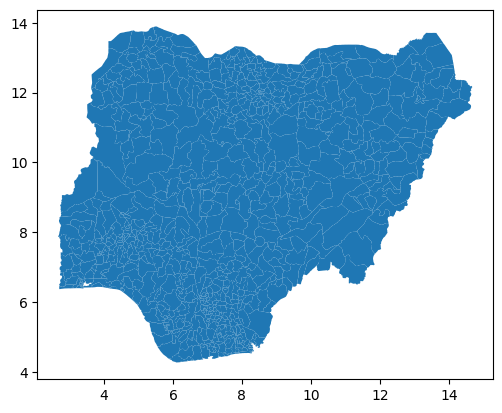

In [ ]:
adm_bdr2.plot()
plt.show()

In [ ]:
bdr2 = adm_bdr2[['lga', 'state', 'geometry']]
bdr1 = adm_bdr1[['state', 'geometry']]
df1 = df[['publish_date', 'victims', 'kidnapper', 'lat', 'lng', 'address']]

print(bdr1.head())
print(bdr2.head())
df1.head()

       state                                           geometry
0       Abia  MULTIPOLYGON (((7.38681 6.03667, 7.38729 6.036...
1    Adamawa  MULTIPOLYGON (((13.62129 10.94823, 13.62592 10...
2  Akwa Ibom  MULTIPOLYGON (((8.34482 4.61140, 8.34496 4.609...
3    Anambra  MULTIPOLYGON (((6.93254 6.71090, 6.93167 6.698...
4     Bauchi  MULTIPOLYGON (((10.75125 12.46148, 10.75615 12...
         lga                      state  \
0  Aba North                       Abia   
1  Aba South                       Abia   
2      Abaji  Federal Capital Territory   
3       Abak                  Akwa Ibom   
4  Abakaliki                     Ebonyi   

                                            geometry  
0  MULTIPOLYGON (((7.40111 5.08195, 7.40013 5.082...  
1  MULTIPOLYGON (((7.38749 5.08275, 7.38632 5.082...  
2  MULTIPOLYGON (((7.04587 9.23050, 7.02654 9.222...  
3  MULTIPOLYGON (((7.81124 5.09453, 7.81233 5.093...  
4  MULTIPOLYGON (((8.41090 6.28212, 8.41285 6.279...  


,publish_date,victims,kidnapper,lat,lng,address
0,2023-05-09,"40 Kaduna worshippers, nine emir ’s children",Bandits,10.270386,7.179026,"Chikun, Kaduna, Nigeria"
1,2023-05-08,"Kaduna monarch 's nine children, others",Terrorists,10.501518,7.440840,"800283, Kaduna, Nigeria"
2,2023-05-01,two Catholic priests,Gunmen,5.549430,5.766851,"Warri, Delta, Nigeria"
3,2023-04-29,selves,Lagos couple,6.220900,6.936956,"Anambra, Nigeria"
4,2023-04-27,Zamfara district head,Bandits,12.595189,6.586347,"631101, Kaura Namoda, Zamfara, Nigeria"


In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1266 entries, 0 to 1265
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   publish_date  1266 non-null   datetime64[ns]
 1   victims       1203 non-null   object        
 2   kidnapper     1069 non-null   object        
 3   lat           1266 non-null   float64       
 4   lng           1266 non-null   float64       
 5   address       1266 non-null   object        
dtypes: datetime64[ns](1), float64(2), object(3)
memory usage: 59.5+ KB


In [ ]:
df1 = df1[(df1['lat'].between(3, 15)) & (df1['lng'].between(3, 15))]
df1.shape

(1198, 6)

In [ ]:
gdf = gpd.GeoDataFrame(df1, geometry=gpd.points_from_xy(df1.lng, df1.lat), crs='EPSG:4326')
gdf

,publish_date,victims,kidnapper,lat,lng,address,geometry
0,2023-05-09,"40 Kaduna worshippers, nine emir ’s children",Bandits,10.270386,7.179026,"Chikun, Kaduna, Nigeria",POINT (7.17903 10.27039)
1,2023-05-08,"Kaduna monarch 's nine children, others",Terrorists,10.501518,7.440840,"800283, Kaduna, Nigeria",POINT (7.44084 10.50152)
2,2023-05-01,two Catholic priests,Gunmen,5.549430,5.766851,"Warri, Delta, Nigeria",POINT (5.76685 5.54943)
3,2023-04-29,selves,Lagos couple,6.220900,6.936956,"Anambra, Nigeria",POINT (6.93696 6.22090)
4,2023-04-27,Zamfara district head,Bandits,12.595189,6.586347,"631101, Kaura Namoda, Zamfara, Nigeria",POINT (6.58635 12.59519)
...,...,...,...,...,...,...,...
1261,2017-01-16,Malaysia-based man,Gunmen,5.591627,7.051189,"Mbieri, Imo, Nigeria",POINT (7.05119 5.59163)
1262,2017-01-16,ex-union official,Gunmen,6.220900,6.936956,"Anambra, Nigeria",POINT (6.93696 6.22090)
1263,2016-12-22,Delta monarch,Gunmen,6.205929,6.695894,"Asaba, Delta, Nigeria",POINT (6.69589 6.20593)
1264,2016-12-22,Female customs official,NaN,6.470253,3.281805,"Festac Town 102102, Lagos, Nigeria",POINT (3.28180 6.47025)


In [ ]:
# state_gdf = gpd.sjoin(bdr1, gdf, op='contains')
state_gdf = gpd.sjoin(gdf, bdr1).drop(columns=['index_right'])
lga_gdf = gpd.sjoin(gdf, bdr2).drop(columns=['index_right'])
state_gdf.head()
lga_gdf.tail()

,publish_date,victims,kidnapper,lat,lng,address,geometry,lga,state
1241,2017-04-11,"Turkish expatriates, polytechnic proprietor in...",Gunmen,4.912666,7.589737,"Ukanafun, Akwa Ibom, Nigeria",POINT (7.58974 4.91267),Ukanafun,Akwa Ibom
1244,2017-03-28,10,Boko Haram,11.654921,13.419664,"610104, Konduga, Borno, Nigeria",POINT (13.41966 11.65492),Konduga,Borno
1245,2017-03-28,"four women, six youths",Boko Haram,11.654921,13.419664,"610104, Konduga, Borno, Nigeria",POINT (13.41966 11.65492),Konduga,Borno
1247,2017-02-23,two dredgers,Gunmen,6.456905,3.885896,"Ibeju Lekki, Lagos, Nigeria",POINT (3.88590 6.45691),Ibeju/Lekki,Lagos
1248,2017-02-22,Umuahia-based businessman,Gunmen,5.452735,7.524841,"Abia, Nigeria",POINT (7.52484 5.45274),Umuahia South,Abia


In [ ]:
geop_zones = {('Borno', 'Gombe', 'Adamawa', 'Yobe', 'Bauchi', 'Taraba'): 'NE',
              ('Jigawa', 'Kaduna', 'Kano', 'Katsina', 'Kebbi', 'Sokoto', 'Zamfara'): 'NW',
              ('Benue', 'Kogi', 'Kwara', 'Nasarawa', 'Niger', 'Plateau', 'Federal Capital Territory'): 'NC',
              ('Ebonyi', 'Abia', 'Anambra', 'Imo', 'Enugu'): 'SE',
              ('Lagos', 'Osun', 'Oyo', 'Ekiti', 'Ogun', 'Ondo'): 'SW',
              ('Delta', 'Edo', 'Akwa Ibom', 'Bayelsa', 'Cross River', 'Rivers'): 'SS'}

# Function to assign geopolitical zones based on the 'State' column
def get_geopolitical_zone(state):
    for zone_states, zone_code in geop_zones.items():
        if state in zone_states:
            return zone_code
    return 'Unknown'

print(get_geopolitical_zone('Federal Capital Territory'))

NC


In [ ]:
# Create the 'Geopolitical Zone' column in the DataFrame
lga_gdf['Geopolitical Zone'] = lga_gdf['state'].apply(get_geopolitical_zone)
lga_gdf.head()

,publish_date,victims,kidnapper,lat,lng,address,geometry,lga,state,Geopolitical Zone
0,2023-05-09,"40 Kaduna worshippers, nine emir ’s children",Bandits,10.270386,7.179026,"Chikun, Kaduna, Nigeria",POINT (7.17903 10.27039),Chikun,Kaduna,NW
6,2023-04-19,746,Bandits,10.270386,7.179026,"Chikun, Kaduna, Nigeria",POINT (7.17903 10.27039),Chikun,Kaduna,NW
79,2022-07-26,scores,Bandits,10.270386,7.179026,"Chikun, Kaduna, Nigeria",POINT (7.17903 10.27039),Chikun,Kaduna,NW
91,2022-06-22,"military officer ’s wife, six others",Bandits,10.269744,7.110136,"800104, Chikun, Kaduna, Nigeria",POINT (7.11014 10.26974),Chikun,Kaduna,NW
123,2022-03-11,two women,bandits,10.270386,7.179026,"Chikun, Kaduna, Nigeria",POINT (7.17903 10.27039),Chikun,Kaduna,NW


In [ ]:
# Extract the year from the 'publish_date' column and create a new column 'Year'
lga_gdf['Year'] = lga_gdf['publish_date'].dt.year

# Group the data by 'Year' and 'Geopolitical Zone' and count the occurrences
yearly_zone_counts = lga_gdf.groupby(['Year', 'Geopolitical Zone']).size().unstack()

yearly_zone_counts

Geopolitical Zone,NC,NE,NW,SE,SS,SW
Year,,,,,,
2016,16,3,6,9,35,23
2017,14,13,10,9,31,39
2018,12,5,17,11,27,18
2019,23,30,39,27,35,34
2020,44,12,62,17,32,33
2021,54,18,83,16,25,47
2022,72,11,67,30,21,24
2023,14,1,11,6,7,2


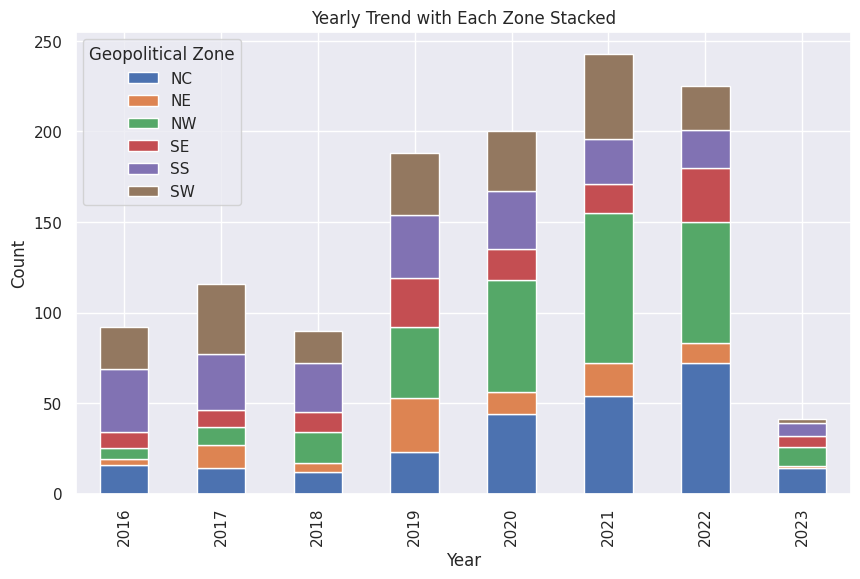

In [ ]:
# Plot the stacked bar chart
sns.set(style="dark")

yearly_zone_counts.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Yearly Trend with Each Zone Stacked')
plt.grid(True)
plt.legend(title='Geopolitical Zone')
plt.show()

In [ ]:
state_gdf.shape


(1195, 8)

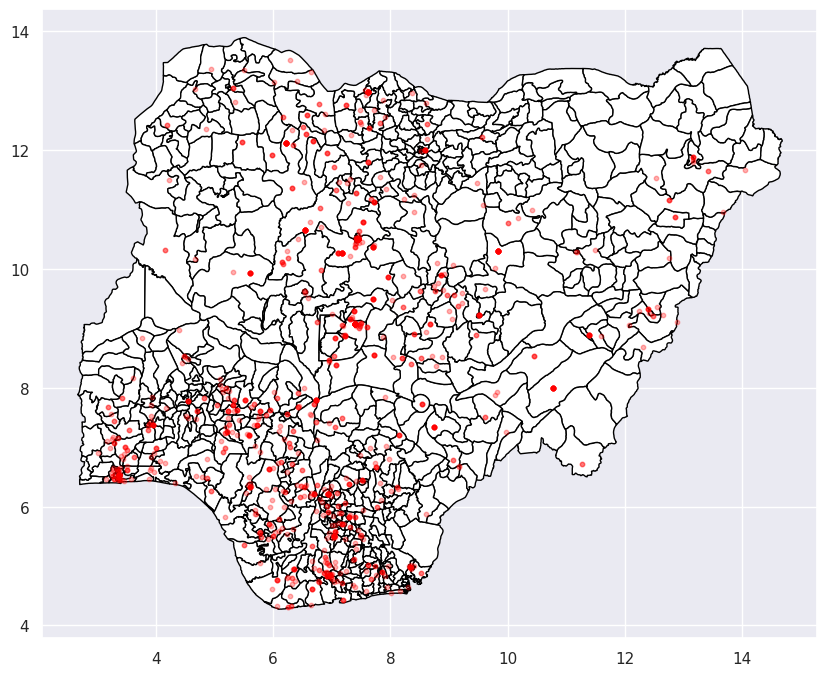

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
bdr2.plot(ax=ax, edgecolor='black', color='white')
ax.scatter(x=lga_gdf.lng, y=lga_gdf.lat, c='red', s=10, alpha=0.3)
plt.grid()
plt.show()

In [ ]:
state_gdf['year'] = state_gdf['publish_date'].dt.year

# groupby state and count the occurrence
state_count = state_gdf.groupby(['state', 'year']).size().reset_index(name='count')
print(state_count.shape)
state_count.head()

(221, 3)


,state,year,count
0,Abia,2016,2
1,Abia,2017,1
2,Abia,2018,2
3,Abia,2019,1
4,Abia,2020,3


In [ ]:
lga_gdf.head()

,publish_date,victims,kidnapper,lat,lng,address,geometry,lga,state,Geopolitical Zone,Year
0,2023-05-09,"40 Kaduna worshippers, nine emir ’s children",Bandits,10.270386,7.179026,"Chikun, Kaduna, Nigeria",POINT (7.17903 10.27039),Chikun,Kaduna,NW,2023
6,2023-04-19,746,Bandits,10.270386,7.179026,"Chikun, Kaduna, Nigeria",POINT (7.17903 10.27039),Chikun,Kaduna,NW,2023
79,2022-07-26,scores,Bandits,10.270386,7.179026,"Chikun, Kaduna, Nigeria",POINT (7.17903 10.27039),Chikun,Kaduna,NW,2022
91,2022-06-22,"military officer ’s wife, six others",Bandits,10.269744,7.110136,"800104, Chikun, Kaduna, Nigeria",POINT (7.11014 10.26974),Chikun,Kaduna,NW,2022
123,2022-03-11,two women,bandits,10.270386,7.179026,"Chikun, Kaduna, Nigeria",POINT (7.17903 10.27039),Chikun,Kaduna,NW,2022


In [ ]:
# groupby state and count the occurrence
lga_count = lga_gdf.groupby(['lga', 'Year']).size().reset_index(name='count')
print(lga_count.shape)
lga_count.head()

(662, 3)


,lga,Year,count
0,Aba North,2020,2
1,Aba South,2016,1
2,Abaji,2020,2
3,Abaji,2022,1
4,Abak,2018,2


In [ ]:
table = pd.pivot_table(state_count, values='count', index='state', columns='year', fill_value=0)
print(table.shape)
table

(36, 8)


year,2016,2017,2018,2019,2020,2021,2022,2023
state,,,,,,,,
Abia,2,1,2,1,3,3,2,1
Adamawa,0,0,0,7,2,5,0,0
Akwa Ibom,3,3,6,0,2,4,2,0
Anambra,4,5,3,7,3,2,10,2
Bauchi,0,8,0,3,2,5,8,1
Bayelsa,7,2,6,2,0,6,1,0
Benue,2,0,0,2,11,3,6,1
Borno,3,2,2,2,2,4,2,0
Cross River,5,2,2,2,6,0,0,0


In [ ]:
# Calculate the total counts for each year
total_counts_per_year = table.sum()

# Calculate the percentage for each state per year
percentage_table = table.div(total_counts_per_year) * 100

# Print the shape of the table and the table itself
print(percentage_table.shape)
percentage_table


(36, 8)


year,2016,2017,2018,2019,2020,2021,2022,2023
state,,,,,,,,
Abia,2.173913,0.862069,2.222222,0.531915,1.5,1.234568,0.888889,2.439024
Adamawa,0.000000,0.000000,0.000000,3.723404,1.0,2.057613,0.000000,0.000000
Akwa Ibom,3.260870,2.586207,6.666667,0.000000,1.0,1.646091,0.888889,0.000000
Anambra,4.347826,4.310345,3.333333,3.723404,1.5,0.823045,4.444444,4.878049
Bauchi,0.000000,6.896552,0.000000,1.595745,1.0,2.057613,3.555556,2.439024
Bayelsa,7.608696,1.724138,6.666667,1.063830,0.0,2.469136,0.444444,0.000000
Benue,2.173913,0.000000,0.000000,1.063830,5.5,1.234568,2.666667,2.439024
Borno,3.260870,1.724138,2.222222,1.063830,1.0,1.646091,0.888889,0.000000
Cross River,5.434783,1.724138,2.222222,1.063830,3.0,0.000000,0.000000,0.000000


In [ ]:
print(type(percentage_table))

percentage_table.columns

percentage_table[2020].sum()

<class 'pandas.core.frame.DataFrame'>


100.0

In [ ]:
# merge the state_count with the state_boundaries based on the state column
merged = bdr1.merge(percentage_table, on='state', how='left').fillna(0)
print(merged.shape)
merged.head()

(37, 10)


,state,geometry,2016,2017,2018,2019,2020,2021,2022,2023
0,Abia,"MULTIPOLYGON (((7.38681 6.03667, 7.38729 6.036...",2.173913,0.862069,2.222222,0.531915,1.5,1.234568,0.888889,2.439024
1,Adamawa,"MULTIPOLYGON (((13.62129 10.94823, 13.62592 10...",0.000000,0.000000,0.000000,3.723404,1.0,2.057613,0.000000,0.000000
2,Akwa Ibom,"MULTIPOLYGON (((8.34482 4.61140, 8.34496 4.609...",3.260870,2.586207,6.666667,0.000000,1.0,1.646091,0.888889,0.000000
3,Anambra,"MULTIPOLYGON (((6.93254 6.71090, 6.93167 6.698...",4.347826,4.310345,3.333333,3.723404,1.5,0.823045,4.444444,4.878049
4,Bauchi,"MULTIPOLYGON (((10.75125 12.46148, 10.75615 12...",0.000000,6.896552,0.000000,1.595745,1.0,2.057613,3.555556,2.439024


In [ ]:
lga_table = pd.pivot_table(lga_count, values='count', index='lga', columns='Year', fill_value=0)
print(lga_table.shape)
lga_table.head()

(328, 8)


Year,2016,2017,2018,2019,2020,2021,2022,2023
lga,,,,,,,,
Aba North,0,0,0,0,2,0,0,0
Aba South,1,0,0,0,0,0,0,0
Abaji,0,0,0,0,2,0,1,0
Abak,0,0,2,0,0,0,0,0
Abakaliki,0,0,0,0,0,0,1,0


In [ ]:
# merge the state_count with the state_boundaries based on the state column
lga_merged = bdr2.merge(lga_table, on='lga', how='left').fillna(0)
print(lga_merged.shape)
lga_merged.head()

(774, 11)


,lga,state,geometry,2016,2017,2018,2019,2020,2021,2022,2023
0,Aba North,Abia,"MULTIPOLYGON (((7.40111 5.08195, 7.40013 5.082...",0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
1,Aba South,Abia,"MULTIPOLYGON (((7.38749 5.08275, 7.38632 5.082...",1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Abaji,Federal Capital Territory,"MULTIPOLYGON (((7.04587 9.23050, 7.02654 9.222...",0.0,0.0,0.0,0.0,2.0,0.0,1.0,0.0
3,Abak,Akwa Ibom,"MULTIPOLYGON (((7.81124 5.09453, 7.81233 5.093...",0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0
4,Abakaliki,Ebonyi,"MULTIPOLYGON (((8.41090 6.28212, 8.41285 6.279...",0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


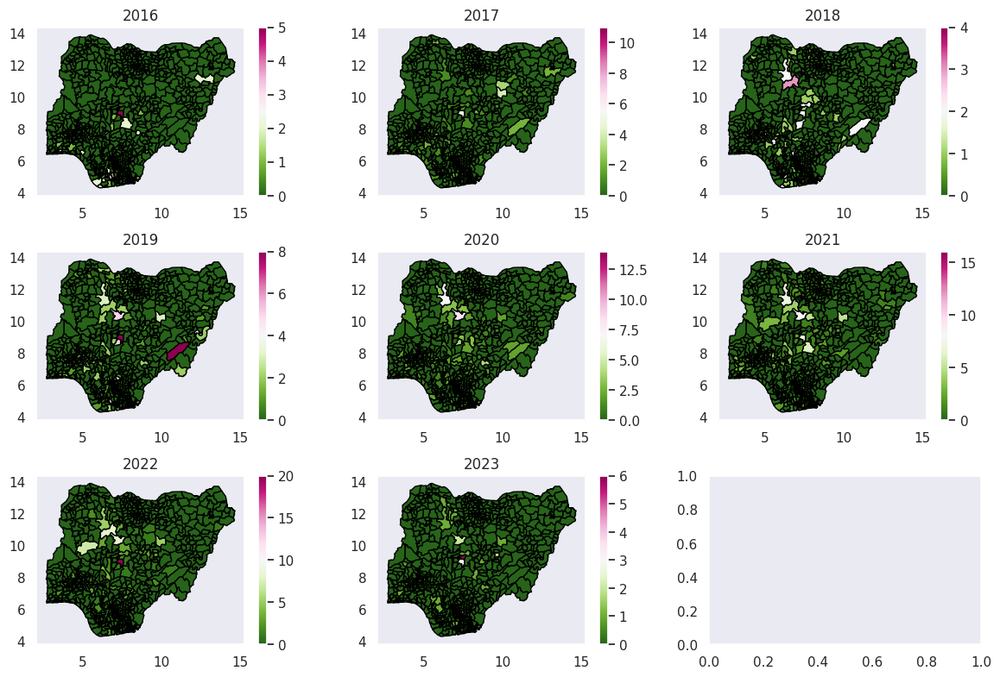

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assume 'merged' is your GeoDataFrame

# Get the columns with years (excluding the 'state' and 'geometry' columns)
year_columns = lga_merged.columns[3:]

# Set the number of rows and columns for the subplot grid
num_rows = 3
num_cols = 3

# Create the subplot grid
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 8))

# Flatten the axes array to simplify indexing
axes = axes.flatten()

# Loop through each year column and draw the choropleth map on the corresponding subplot
for i, year_column in enumerate(year_columns):
    # Get the corresponding subplot
    ax = axes[i]

    # Plot the choropleth map for the current year
    lga_merged.plot(column=year_column, cmap='PiYG_r', ax=ax, legend=True, edgecolor='black')

    # Set the title for the subplot as the year
    ax.set_title(year_column)

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


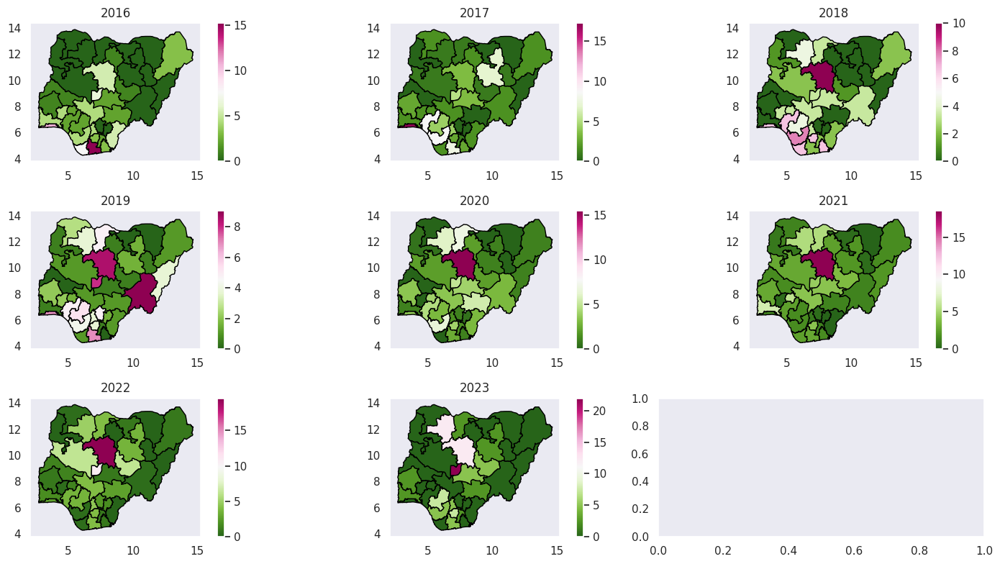

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assume 'merged' is your GeoDataFrame

# Get the columns with years (excluding the 'state' and 'geometry' columns)
year_columns = merged.columns[2:]

# Set the number of rows and columns for the subplot grid
num_rows = 3
num_cols = 3

# Create the subplot grid
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 8))

# Flatten the axes array to simplify indexing
axes = axes.flatten()

# Loop through each year column and draw the choropleth map on the corresponding subplot
for i, year_column in enumerate(year_columns):
    # Get the corresponding subplot
    ax = axes[i]

    # Plot the choropleth map for the current year
    merged.plot(column=year_column, cmap='PiYG_r', ax=ax, legend=True, edgecolor='black')

    # Set the title for the subplot as the year
    ax.set_title(year_column)

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
# merge the state_count with the state_boundaries based on the state column
merged_lga = bdr2.merge(lga_count, on='lga')
print(merged_lga.shape)
merged_lga.head()

(333, 4)


,lga,state,geometry,count
0,Aba North,Abia,"MULTIPOLYGON (((7.40111 5.08195, 7.40013 5.082...",2
1,Aba South,Abia,"MULTIPOLYGON (((7.38749 5.08275, 7.38632 5.082...",1
2,Abaji,Federal Capital Territory,"MULTIPOLYGON (((7.04587 9.23050, 7.02654 9.222...",3
3,Abak,Akwa Ibom,"MULTIPOLYGON (((7.81124 5.09453, 7.81233 5.093...",2
4,Abakaliki,Ebonyi,"MULTIPOLYGON (((8.41090 6.28212, 8.41285 6.279...",1


In [ ]:
merged_lga.max()

<ipython-input-33-163d9fa325db>:1: FutureWarning: The default value of numeric_only in GeoDataFrame.max is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  merged_lga.max()


lga        Zurmi
state    Zamfara
count         53
dtype: object

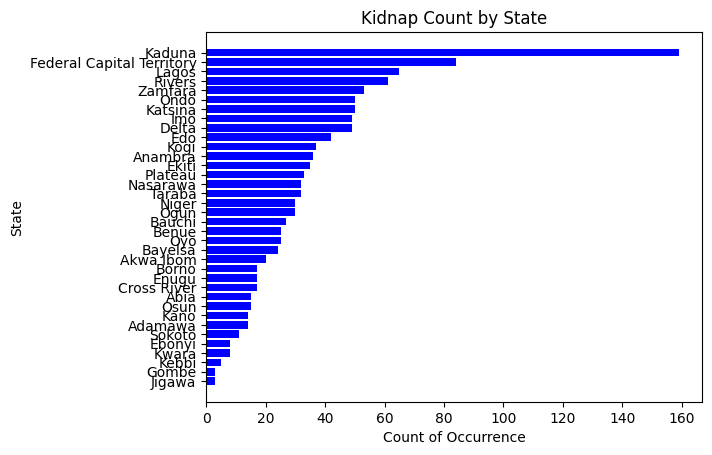

In [ ]:
# Sort by count in descending order
state_count = state_count.sort_values(by='count', ascending=True).rename(columns={'admin1Name':'state'})

# Create horizontal bar chart
plt.barh(state_count['state'], state_count['count'], color='blue')

# Set axis labels and title
plt.xlabel('Count of Occurrence')
plt.ylabel('State')
plt.title('Kidnap Count by State')

# Show the chart
plt.show()


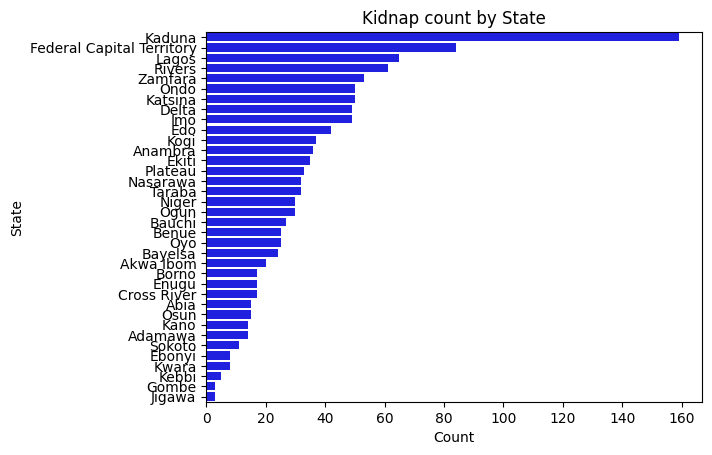

In [ ]:
# Sort the dataframe by count in descending order
state_count = state_count.sort_values(by='count', ascending=False).rename(columns={'admin1Name':'state'})

# Create a horizontal bar chart using Seaborn
#sns.set(style="whitegrid")
ax = sns.barplot(x='count', y='state', data=state_count, color='blue')

# Set x-axis and y-axis label
ax.set_xlabel('Count')
ax.set_ylabel('State')

# Set chart title
ax.set_title('Kidnap count by State')

# Show the plot
plt.show()


In [ ]:
merged.isna().sum()

state       0
geometry    0
count       0
dtype: int64

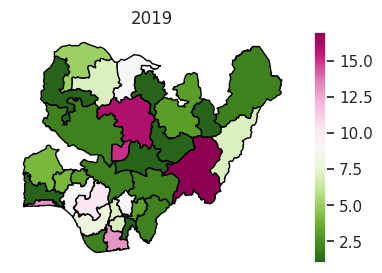

In [ ]:
# plot the choropleth map
fig, ax = plt.subplots(figsize=(5, 3))
state_count_2019.plot(column='count', cmap='PiYG_r', ax=ax, legend=True, edgecolor='black')
ax.axis('off')
ax.set_title('2019')
plt.show()

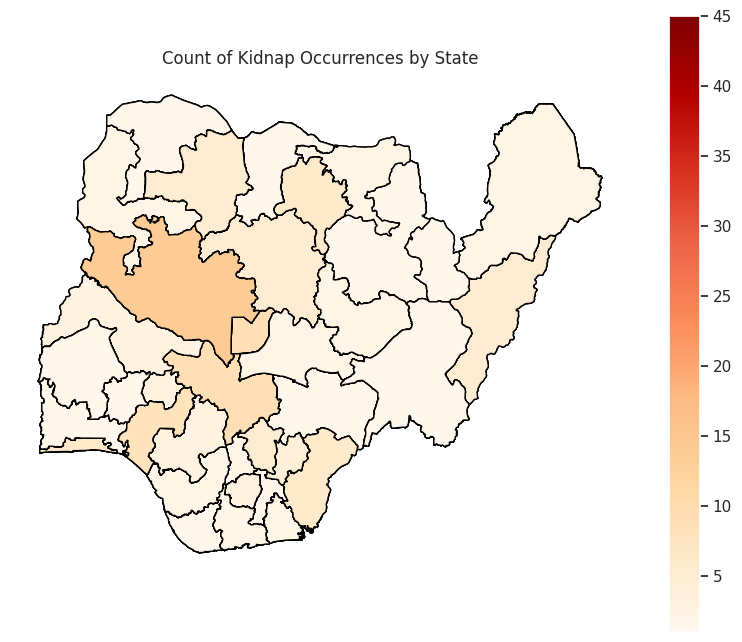

In [ ]:
# plot the choropleth map
fig, ax = plt.subplots(figsize=(10, 8))
merged.plot(column='count', cmap='OrRd', ax=ax, legend=True, edgecolor='black')
ax.axis('off')
ax.set_title('Count of Kidnap Occurrences by State')
plt.show()

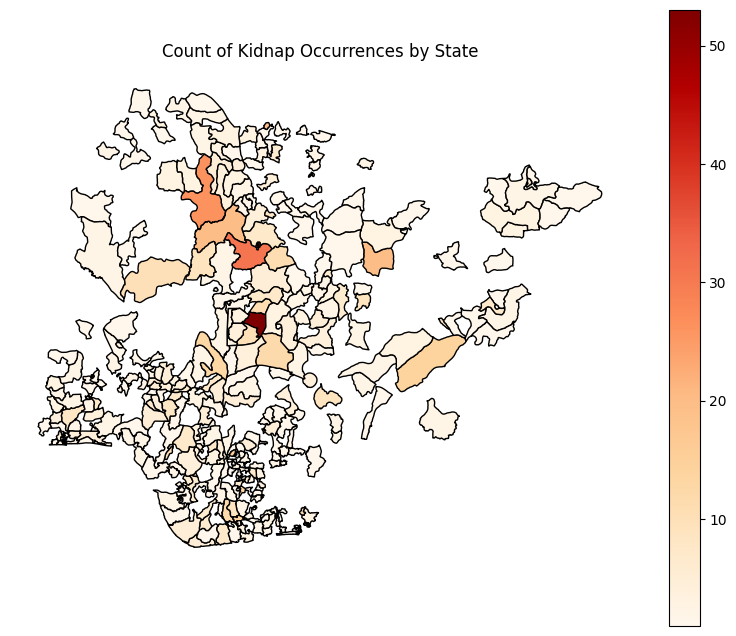

In [ ]:
# plot the choropleth map
fig, ax = plt.subplots(figsize=(10, 8))
merged_lga.plot(column='count', cmap='OrRd', ax=ax, legend=True, edgecolor='black')
ax.axis('off')
ax.set_title('Count of Kidnap Occurrences by State')
plt.show()

In [ ]:
# merged2 = merged.merge(bdr1, on='state', )
merged_lga2 = merged_lga.rename(columns={'lga':'admin2Name'})
merged_lga2.head()

,admin2Name,state,geometry,count
0,Aba North,Abia,"MULTIPOLYGON (((7.40111 5.08195, 7.40013 5.082...",2
1,Aba South,Abia,"MULTIPOLYGON (((7.38749 5.08275, 7.38632 5.082...",1
2,Abaji,Federal Capital Territory,"MULTIPOLYGON (((7.04587 9.23050, 7.02654 9.222...",3
3,Abak,Akwa Ibom,"MULTIPOLYGON (((7.81124 5.09453, 7.81233 5.093...",2
4,Abakaliki,Ebonyi,"MULTIPOLYGON (((8.41090 6.28212, 8.41285 6.279...",1


In [ ]:
# merged2 = merged.merge(bdr1, on='state', )
merged2 = merged.rename(columns={'state':'admin1Name'})
merged2.head()

,admin1Name,geometry,count
0,Abia,"MULTIPOLYGON (((7.38681 6.03667, 7.38729 6.036...",15.0
1,Adamawa,"MULTIPOLYGON (((13.62129 10.94823, 13.62592 10...",14.0
2,Akwa Ibom,"MULTIPOLYGON (((8.34482 4.61140, 8.34496 4.609...",20.0
3,Anambra,"MULTIPOLYGON (((6.93254 6.71090, 6.93167 6.698...",36.0
4,Bauchi,"MULTIPOLYGON (((10.75125 12.46148, 10.75615 12...",27.0


<Axes: >

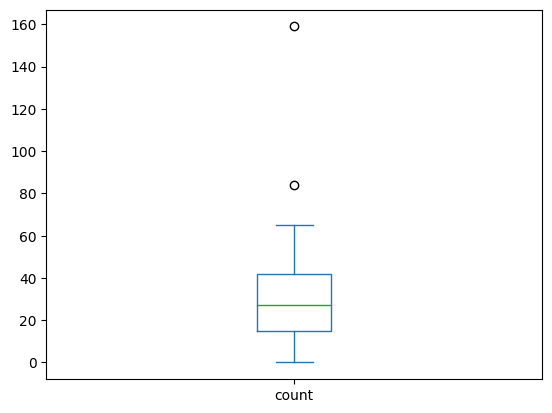

In [ ]:
merged2['count'].plot(kind='box')

In [ ]:
merged2.sort_values(by='count')

,admin1Name,geometry,count
35,Yobe,"MULTIPOLYGON (((11.22181 13.37400, 11.25518 13...",0.0
15,Gombe,"MULTIPOLYGON (((11.07149 11.31249, 11.07479 11...",3.0
17,Jigawa,"MULTIPOLYGON (((10.23002 13.01060, 10.23084 13...",3.0
21,Kebbi,"MULTIPOLYGON (((4.25355 13.26045, 4.26682 13.2...",5.0
23,Kwara,"MULTIPOLYGON (((3.73068 10.06829, 3.73651 10.0...",8.0
10,Ebonyi,"MULTIPOLYGON (((8.24431 6.78560, 8.24976 6.775...",8.0
33,Sokoto,"MULTIPOLYGON (((5.51464 13.89442, 5.52912 13.8...",11.0
1,Adamawa,"MULTIPOLYGON (((13.62129 10.94823, 13.62592 10...",14.0
19,Kano,"MULTIPOLYGON (((8.30528 12.58803, 8.31002 12.5...",14.0
29,Osun,"MULTIPOLYGON (((4.94975 8.05548, 4.95674 8.053...",15.0


In [ ]:
map = folium.Map(location=[9, 9], zoom_start=6, min_zoom=6, max_zoom=8, height=500, width=750)
ranges = [0, 20, 60, 180]

folium.Choropleth(
    geo_data=gpd.read_file(adm_1bdr),
    name='geometry',
    data=merged2,
    columns=['admin1Name', 'count'],
    bins=ranges,
    key_on='feature.properties.admin1Name',
    fill_color='YlOrRd',  # color brewer code
    fill_opacity=0.5,
    line_opacity=0.75,
    legend_name='Risk hostspots by state'
).add_to(map)

folium.LayerControl().add_to(map)
map

In [ ]:
map = folium.Map(location=[9, 9], zoom_start=6, min_zoom=6, max_zoom=8, height=500, width=750)
ranges = [1, 10, 20, 60]

folium.Choropleth(
    geo_data=gpd.read_file(adm_2bdr),
    name='geometry',
    data=merged_lga2,
    columns=['admin2Name', 'count'],
    bins=ranges,
    key_on='feature.properties.admin2Name',
    fill_color='YlOrRd',  # color brewer code
    fill_opacity=0.3,
    line_opacity=0.75,
    legend_name='Risk hostspots by lga'
).add_to(map)

folium.LayerControl().add_to(map)
map

### Kidnapping trends by month and year

In [ ]:
merged_lga2.head()

,admin2Name,state,geometry,count
0,Aba North,Abia,"MULTIPOLYGON (((7.40111 5.08195, 7.40013 5.082...",2
1,Aba South,Abia,"MULTIPOLYGON (((7.38749 5.08275, 7.38632 5.082...",1
2,Abaji,Federal Capital Territory,"MULTIPOLYGON (((7.04587 9.23050, 7.02654 9.222...",3
3,Abak,Akwa Ibom,"MULTIPOLYGON (((7.81124 5.09453, 7.81233 5.093...",2
4,Abakaliki,Ebonyi,"MULTIPOLYGON (((8.41090 6.28212, 8.41285 6.279...",1


In [ ]:
# Load data into a Pandas DataFrame
state_gdf.head()
state_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1195 entries, 0 to 1006
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   publish_date  1195 non-null   datetime64[ns]
 1   victims       1136 non-null   object        
 2   kidnapper     1017 non-null   object        
 3   lat           1195 non-null   float64       
 4   lng           1195 non-null   float64       
 5   address       1195 non-null   object        
 6   geometry      1195 non-null   geometry      
 7   state         1195 non-null   object        
dtypes: datetime64[ns](1), float64(2), geometry(1), object(4)
memory usage: 84.0+ KB


In [ ]:
df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1266 entries, 0 to 1265
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   publish_date  1266 non-null   datetime64[ns]
 1   headline      1266 non-null   object        
 2   article       1266 non-null   object        
 3   crime_locs    1266 non-null   object        
 4   victims       1203 non-null   object        
 5   kidnapper     1069 non-null   object        
 6   geo_locs      1266 non-null   object        
 7   lat           1266 non-null   float64       
 8   lng           1266 non-null   float64       
 9   address       1266 non-null   object        
dtypes: datetime64[ns](1), float64(2), object(7)
memory usage: 99.0+ KB


In [ ]:
# Set date as index
st_gdf = state_gdf.set_index('publish_date')

# Resample to monthly frequency and count occurrences
monthly_counts = st_gdf.resample('M').count()
monthly_counts

,victims,kidnapper,lat,lng,address,geometry,state
publish_date,,,,,,,
2016-02-29,5,4,5,5,5,5,5
2016-03-31,6,5,6,6,6,6,6
2016-04-30,3,2,3,3,3,3,3
2016-05-31,7,6,7,7,7,7,7
2016-06-30,7,5,8,8,8,8,8
...,...,...,...,...,...,...,...
2023-01-31,18,16,19,19,19,19,19
2023-02-28,3,3,3,3,3,3,3
2023-03-31,10,10,10,10,10,10,10


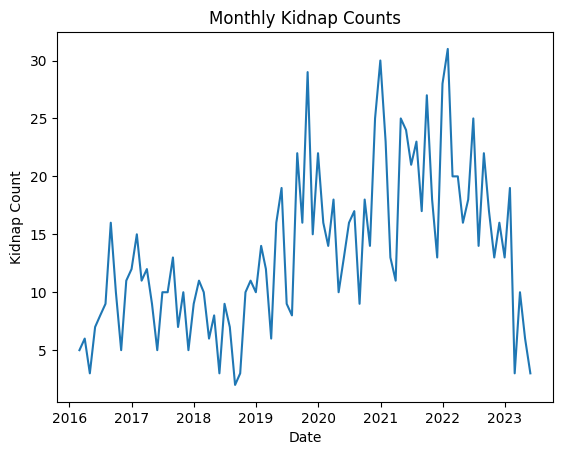

In [ ]:
# Plot the timeseries curve
plt.plot(monthly_counts.index, monthly_counts['state'])
plt.xlabel('Date')
plt.ylabel('Kidnap Count')
plt.title('Monthly Kidnap Counts')
plt.show()

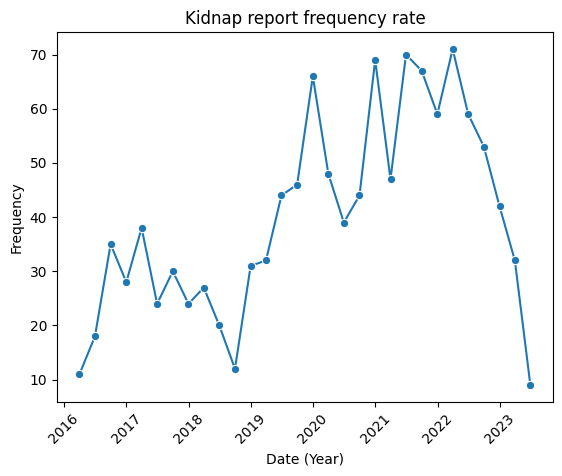

In [ ]:
import matplotlib.dates as mdates

# Resample to quarterly frequency and count occurrences
quarterly_counts = st_gdf.resample('Q').count()

# Plot the timeseries curve
fig, ax = plt.subplots()
sns.set(style="whitegrid")
# ax.plot(quarterly_counts.index, quarterly_counts['state'])
sns.lineplot(data=quarterly_counts['state'], marker='o', ax=ax)
ax.set_xlabel('Date (Year)')
ax.set_ylabel('Frequency')
ax.set_title('Kidnap report frequency rate')

# Set the x-axis ticks to display the quarters
# ax.xaxis.set_major_locator(mdates.QuarterLocator())
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-Q%q'))

plt.xticks(rotation=45)
plt.show()

In [ ]:
quarterly_counts.head()

,victims,kidnapper,lat,lng,address,geometry,state
publish_date,,,,,,,
2016-03-31,11,9,11,11,11,11,11
2016-06-30,17,13,18,18,18,18,18
2016-09-30,34,28,35,35,35,35,35
2016-12-31,23,21,28,28,28,28,28
2017-03-31,38,30,38,38,38,38,38


### Overpopulation and kidnapping

In [ ]:
file_path = '/content/drive/MyDrive/punch_kidnap_dataset/population by state.csv'
pop = pd.read_csv(file_path).rename(columns={'State':'state'})
pop.head(10)

,state,Population (2006),Population (2019)
0,Kano,"9,401,288","14,253,549"
1,Lagos,"9,113,605","12,772,884"
2,Katsina,"5,801,584","9,300,382"
3,Kaduna,"6,113,503","8,324,285"
4,Bauchi,"4,653,066","7,540,663"
5,Oyo,"5,580,894","7,512,855"
6,Rivers,"5,198,716","7,034,973"
7,Jigawa,"4,361,002","6,779,080"
8,Niger,"3,954,772","6,220,617"
9,Ogun,"3,751,140","5,945,275"


In [ ]:
pop# Remove comma delimiters and convert to integer
pop['population 2006'] = pop['Population (2006)'].str.replace(',', '').astype(int)
pop['population 2019'] = pop['Population (2019)'].str.replace(',', '').astype(int)
pop.head()

,state,Population (2006),Population (2019),population 2006,population 2019
0,Kano,"9,401,288","14,253,549",9401288,14253549
1,Lagos,"9,113,605","12,772,884",9113605,12772884
2,Katsina,"5,801,584","9,300,382",5801584,9300382
3,Kaduna,"6,113,503","8,324,285",6113503,8324285
4,Bauchi,"4,653,066","7,540,663",4653066,7540663


In [ ]:
pop_kidnap_count = pop.merge(merged, on='state').sort_values(by="Population (2019)")
# pop_kidnap_count['population 100K'] = pop_kidnap_count['Population (2019)'] / (10**5)
pop_kidnap_count.head()

,state,Population (2006),Population (2019),population 2006,population 2019,geometry,count
1,Lagos,"9,113,605","12,772,884",9113605,12772884,"MULTIPOLYGON (((3.32387 6.67388, 3.32879 6.673...",65.0
0,Kano,"9,401,288","14,253,549",9401288,14253549,"MULTIPOLYGON (((8.30528 12.58803, 8.31002 12.5...",14.0
36,Bayelsa,"1,704,515","2,394,725",1704515,2394725,"MULTIPOLYGON (((6.55283 5.37988, 6.56198 5.379...",24.0
35,Nasarawa,"1,869,377","2,632,239",1869377,2632239,"MULTIPOLYGON (((7.99731 9.31436, 8.00084 9.306...",32.0
34,Federal Capital Territory,"1,406,239","2,702,443",1406239,2702443,"MULTIPOLYGON (((7.67239 9.41128, 7.71959 9.346...",84.0


In [ ]:
pop_final = pop_kidnap_count.drop(columns=['Population (2006)', 'Population (2019)', 'geometry'])
pop_final['log_pop_2006'] = np.log(pop_final['population 2006'])
pop_final['log_pop_2019'] = np.log(pop_final['population 2019'])
pop_final['log_count'] = np.log(pop_final['count'])
pop_final.head()

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,state,population 2006,population 2019,count,log_pop_2006,log_pop_2019,log_count
1,Lagos,9113605,12772884,65.0,16.025279,16.362835,4.174387
0,Kano,9401288,14253549,14.0,16.056357,16.472516,2.639057
36,Bayelsa,1704515,2394725,24.0,14.348791,14.688779,3.178054
35,Nasarawa,1869377,2632239,32.0,14.441116,14.783345,3.465736
34,Federal Capital Territory,1406239,2702443,84.0,14.156429,14.809667,4.430817


In [ ]:
matrix = pop_final.corr()
matrix

<ipython-input-40-7903d6343bb7>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  matrix = pop_final.corr()


,population 2006,population 2019,count,log_pop_2006,log_pop_2019,log_count
population 2006,1.000000,0.983124,0.284172,0.954616,0.950844,0.220834
population 2019,0.983124,1.000000,0.254661,0.926580,0.960284,0.183290
count,0.284172,0.254661,1.000000,0.245321,0.259734,0.832316
log_pop_2006,0.954616,0.926580,0.245321,1.000000,0.975453,0.192302
log_pop_2019,0.950844,0.960284,0.259734,0.975453,1.000000,0.184329
log_count,0.220834,0.183290,0.832316,0.192302,0.184329,1.000000


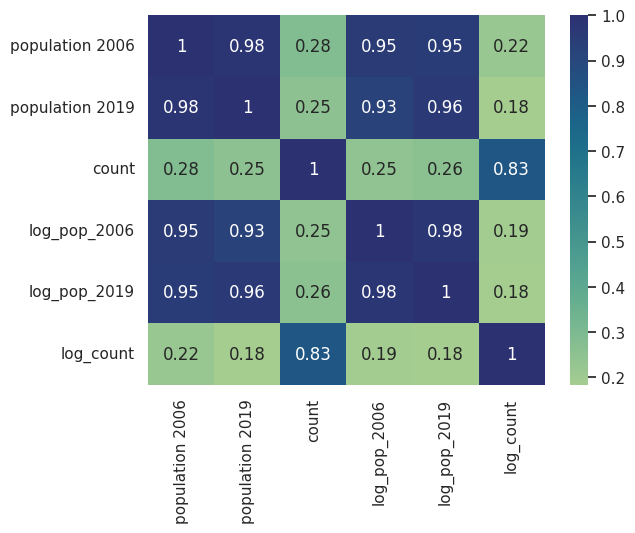

In [ ]:
sns.heatmap(matrix, annot=True, cmap='crest')
plt.show()

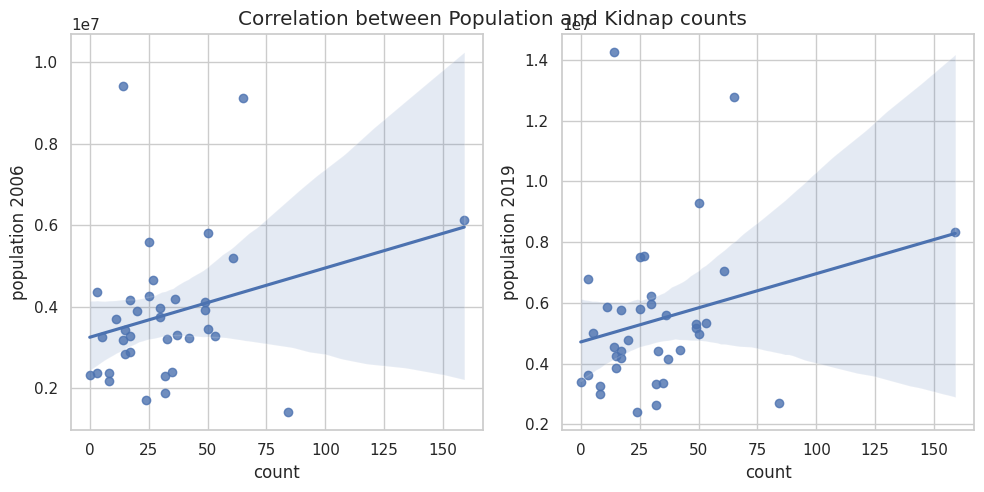

In [ ]:
# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot regplot for Y1
sns.regplot(x='count', y='population 2006', data=pop_final, ax=axes[0])
# axes[0].set_title('Regression Plot Y1')

# Plot regplot for Y2
sns.regplot(x='count', y='population 2019', data=pop_final, ax=axes[1])
# axes[1].set_title('Regression Plot Y2')

# Adjust spacing between subplots
plt.tight_layout()

plt.suptitle('Correlation between Population and Kidnap counts')
# Show the plots
plt.show()


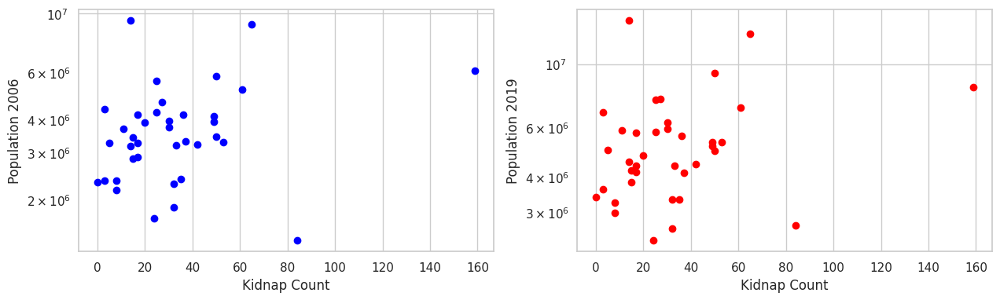

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4))

# Scatter plot on the first subplot (ax1)
ax1.scatter(pop_kidnap_count['count'], pop_kidnap_count["population 2006"], marker="o", color="blue")
ax1.set_xlabel('Kidnap Count')
ax1.set_ylabel('Population 2006')

# Scatter plot on the second subplot (ax2)
ax2.scatter(pop_kidnap_count['count'], pop_kidnap_count["population 2019"], marker="o", color="red")
ax2.set_xlabel('Kidnap Count')
ax2.set_ylabel('Population 2019')

# Set y-axis to log scale
ax1.set_yscale('log')
ax2.set_yscale('log')

# Show the plot
plt.show()


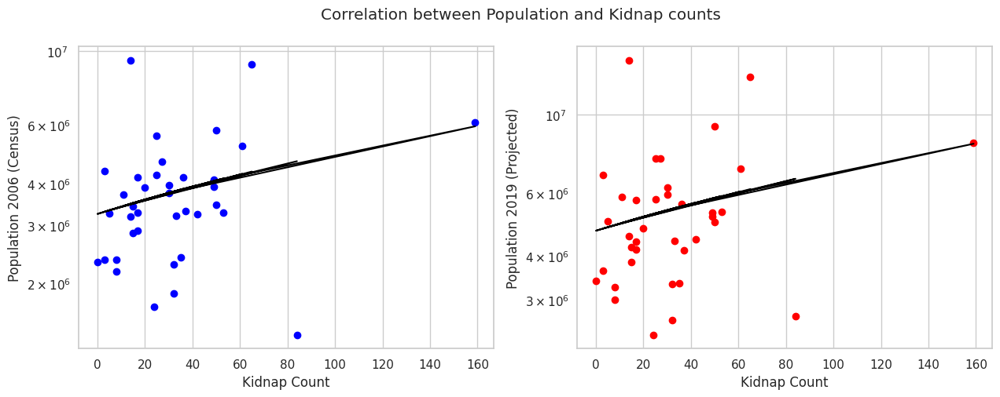

In [ ]:
import numpy as np

# Calculate the best-fit line using NumPy
x = pop_kidnap_count['count']
y1 = pop_kidnap_count['population 2006']
y2 = pop_kidnap_count["population 2019"]
m1, b1 = np.polyfit(x, y1, 1)  # Fit a linear regression line
m2, b2 = np.polyfit(x, y2, 1)  # Fit a linear regression line

# Create the scatter plots with trendlines
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Scatter plot on the first subplot (ax1)
ax1.scatter(x, y1, marker="o", color="blue")
ax1.plot(x, m1*x + b1, color="black")  # Add the trendline
ax1.set_xlabel('Kidnap Count')
ax1.set_ylabel('Population 2006 (Census)')

# Scatter plot on the second subplot (ax2)
ax2.scatter(x, y2, marker="o", color="red")
ax2.plot(x, m2*x + b2, color="black")  # Add the trendline
ax2.set_xlabel('Kidnap Count')
ax2.set_ylabel('Population 2019 (Projected)')

# Set y-axis to log scale
ax1.set_yscale('log')
ax2.set_yscale('log')

# Show the plot
plt.suptitle('Correlation between Population and Kidnap counts')
plt.show()


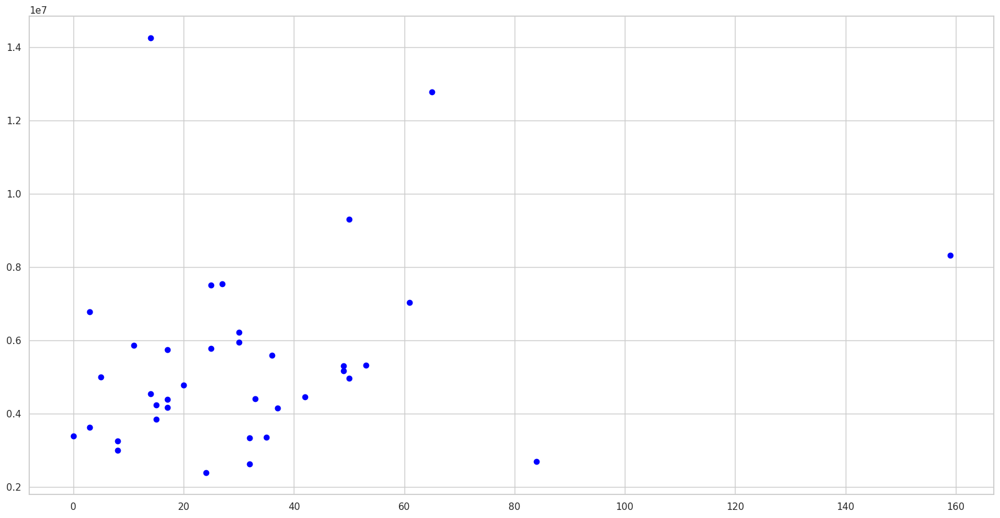

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))
ax.scatter(pop_kidnap_count['count'], pop_kidnap_count["population 2019"], marker="o", color="blue")

plt.show()

In [ ]:
pop_kidnap_count.shape

# Sort the dataframe by kidnap count in descending order
pop_kidnap_count = pop_kidnap_count.sort_values('count', ascending=False)

# Select the top 10 states based on kidnap count
pop_kidnap_count_10 = pop_kidnap_count.head(10)

pop_kidnap_count_10.shape


(10, 7)

In [ ]:
state_gdf.head()
state_gdf['day_name'] = state_gdf['publish_date'].dt.day_name()
state_gdf['year'] = state_gdf['publish_date'].dt.year
state_gdf.head()

,publish_date,victims,kidnapper,lat,lng,address,geometry,state,day_name,year
0,2023-05-09,"40 Kaduna worshippers, nine emir ’s children",Bandits,10.270386,7.179026,"Chikun, Kaduna, Nigeria",POINT (7.17903 10.27039),Kaduna,Tuesday,2023
1,2023-05-08,"Kaduna monarch 's nine children, others",Terrorists,10.501518,7.440840,"800283, Kaduna, Nigeria",POINT (7.44084 10.50152),Kaduna,Monday,2023
6,2023-04-19,746,Bandits,10.270386,7.179026,"Chikun, Kaduna, Nigeria",POINT (7.17903 10.27039),Kaduna,Wednesday,2023
32,2022-12-28,Anambra bizman,Gunmen,10.501518,7.440840,"800283, Kaduna, Nigeria",POINT (7.44084 10.50152),Kaduna,Wednesday,2022
46,2022-11-08,Catholic priest,Terrorists,10.376401,7.709454,"Kaduna, Nigeria",POINT (7.70945 10.37640),Kaduna,Tuesday,2022


In [ ]:
grouped = state_gdf.groupby(['year', 'day_name']).size().reset_index(name='count')

# Define the order of the day names
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Convert the 'dayname' column to a categorical data type with the specified order
grouped['day_name'] = pd.Categorical(grouped['day_name'], categories=day_order, ordered=True)

# Group the data by year and day_name and calculate the sum of counts
grouped_df = grouped.groupby(['year', 'day_name'])['count'].sum().unstack()

grouped.head()
grouped.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56 entries, 0 to 55
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   year      56 non-null     int64   
 1   day_name  56 non-null     category
 2   count     56 non-null     int64   
dtypes: category(1), int64(2)
memory usage: 1.4 KB


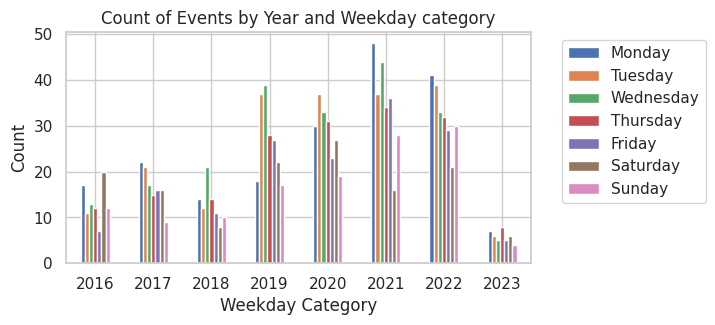

In [ ]:
# Plot the grouped bar chart
grouped_df.plot(kind='bar', figsize=(6, 3))

# Set the plot title and axis labels
plt.title('Count of Events by Year and Weekday category')
plt.xlabel('Weekday Category')
plt.ylabel('Count')
plt.xticks(rotation=0)

# Move the legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()

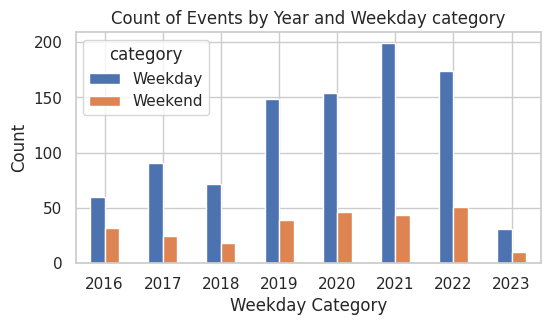

In [ ]:
grouped = state_gdf.groupby(['year', 'day_name']).size().reset_index(name='count')

# Add a new column to classify weekdays and weekends
grouped['category'] = grouped['day_name'].apply(lambda x: 'Weekend' if x in ['Saturday', 'Sunday'] else 'Weekday')

# Group the data by year and day_name and calculate the sum of counts
grouped_df = grouped.groupby(['year', 'category'])['count'].sum().unstack()

# Plot the grouped bar chart
grouped_df.plot(kind='bar', figsize=(6, 3))

# Set the plot title and axis labels
plt.title('Count of Events by Year and Weekday category')
plt.xlabel('Weekday Category')
plt.ylabel('Count')
plt.xticks(rotation=0)

# Show the plot
plt.show()

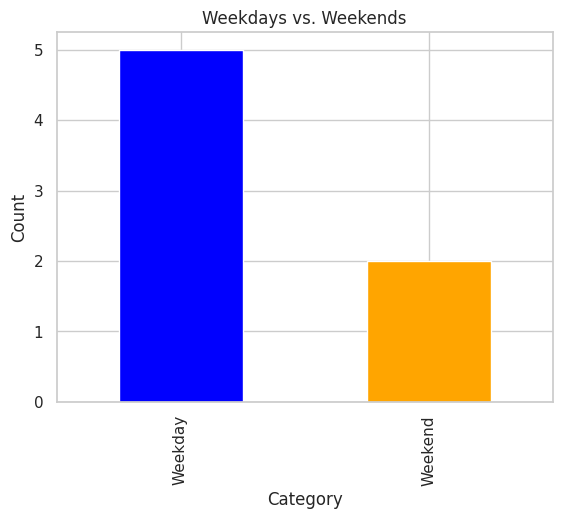

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Create a sample dataframe with day_name column
df = pd.DataFrame({'day_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']})

# Add a new column to classify weekdays and weekends
df['category'] = df['day_name'].apply(lambda x: 'Weekend' if x in ['Saturday', 'Sunday'] else 'Weekday')

# Group the data by category and count the occurrences
grouped_df = df.groupby('category').size()

# Plot the grouped bar plot
grouped_df.plot(kind='bar', color=['blue', 'orange'])

# Set the plot title and axis labels
plt.title('Weekdays vs. Weekends')
plt.xlabel('Category')
plt.ylabel('Count')

# Show the plot
plt.show()
